# This is a sample Jupyter Notebook

Below is an example of a code cell. 
Put your cursor into the cell and press Shift+Enter to execute it and select the next one, or click 'Run Cell' button.

Press Double Shift to search everywhere for classes, files, tool windows, actions, and settings.

To learn more about Jupyter Notebooks in PyCharm, see [help](https://www.jetbrains.com/help/pycharm/ipython-notebook-support.html).
For an overview of PyCharm, go to Help -> Learn IDE features or refer to [our documentation](https://www.jetbrains.com/help/pycharm/getting-started.html).

C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_10092\1970182200.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model\\model.pth')
C:\Us

before：snr3.9693242074145783
After：snr15.980080001421435
before：ssim0.5722350507807262
After：ssim0.9441160634454148
MSE between original and denoised data:  0.00043628755646566976


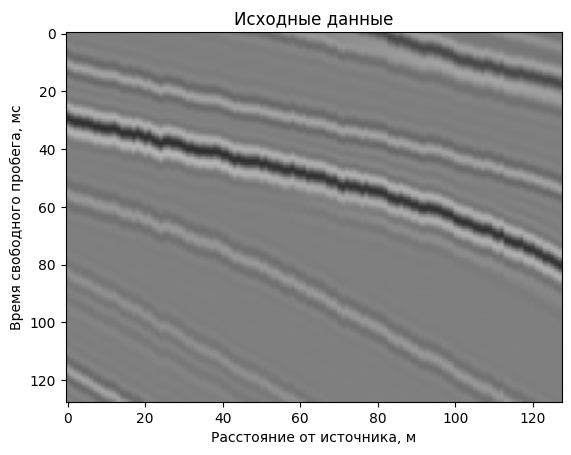

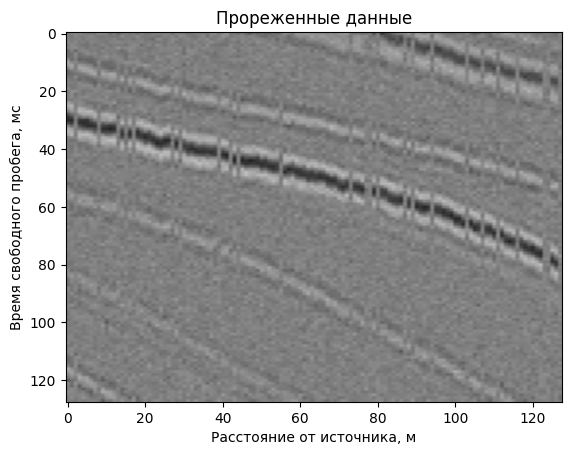

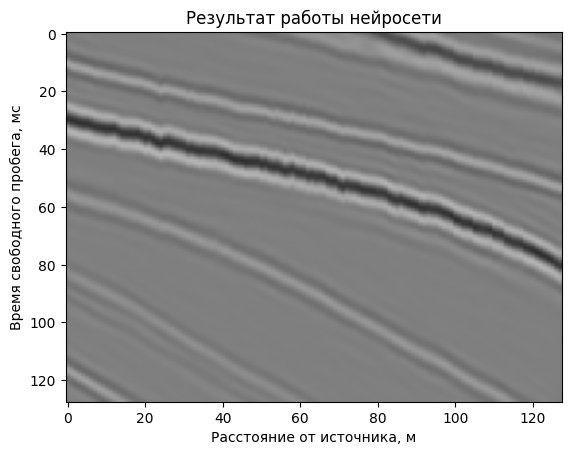

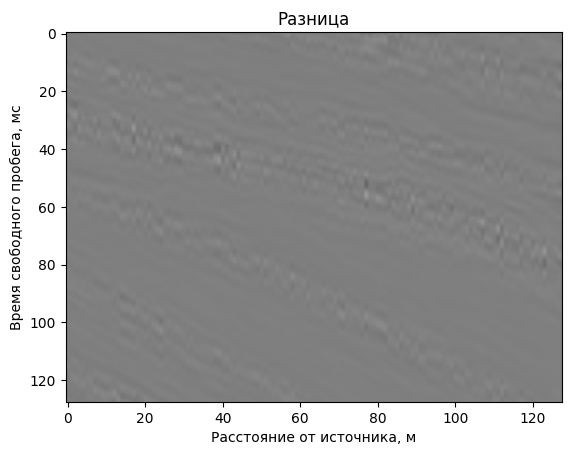

In [1]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt

if __name__ == '__main__':

    model = torch.load('trained_model\\model.pth')

    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    x = np.load('test_data/clear.npy')
    x = x.astype(np.float64)

    y = np.load('test_data/noise_and_miss.npy')
    y_ = torch.from_numpy(y).view(1, -1, y.shape[0], y.shape[1])

    torch.cuda.synchronize()
    start_time = time.time()
    y_ = y_.type(torch.float32)
    y_ = y_.cuda()

    x_ = model(y_)  # inferences
    x_ = x_.view(y.shape[0], y.shape[1])
    x_ = x_.cpu()
    x_ = x_.detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    pre_snr = snr_(y, x)
    print("before：snr" + str(pre_snr))
    snr = snr_(x_, x)
    print("After：snr" + str(snr))

    # Исправленный вызов ssim_
    pre_ssim = ssim_(y, x, data_range=1.0)  # Указываем data_range
    print("before：ssim" + str(pre_ssim))
    ssim = ssim_(x_, x, data_range=1.0)  # Указываем data_range
    print("After：ssim" + str(ssim))

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Вывод графиков в сером цвете
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_10092\503744674.py:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model\\model.pth')


before：snr1.2464451449107912
After：snr7.558109450305527
before：ssim0.48071784284628494
After：ssim0.828571489403279
MSE between original and denoised data:  0.003033680790495754


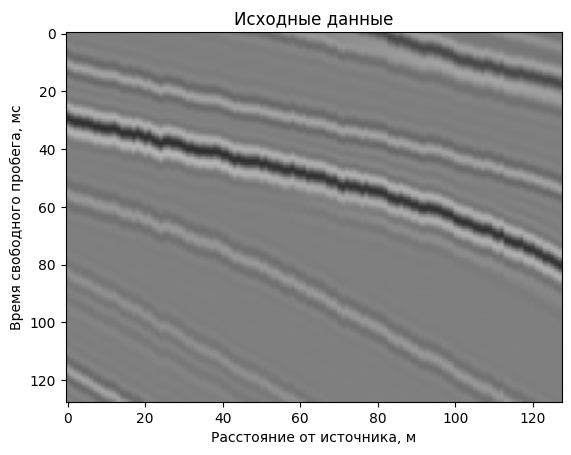

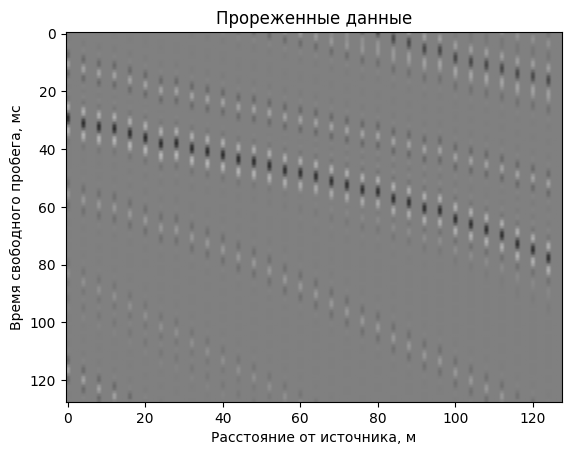

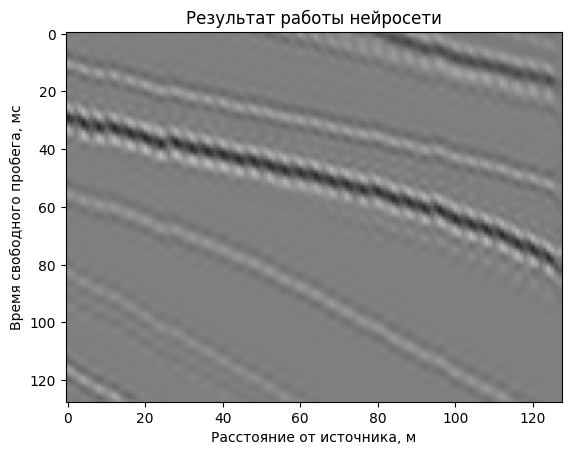

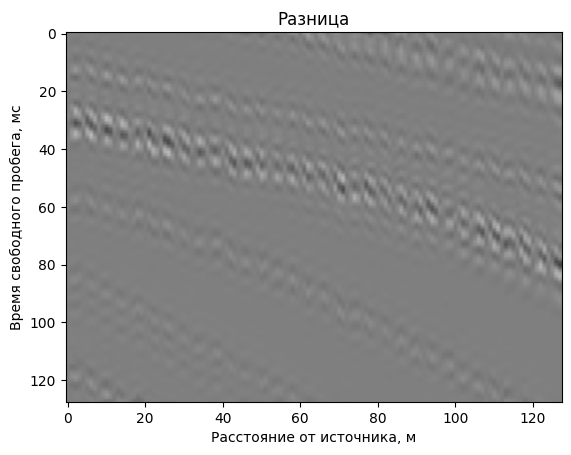

In [2]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import numpy as np


def preprocess_seismic_data(seismic_data, nsub, noise_level=0.1):
    """
    Preprocess seismic data by adding noise and subsampling traces.
    
    Parameters:
        seismic_data (np.ndarray): Original seismic data array.
        nsub (int): Subsampling factor. From every 'nsub' traces, only one is kept.
        noise_level (float): Standard deviation of the Gaussian noise to be added.
        
    Returns:
        np.ndarray: Preprocessed seismic data.
    """
    # Add Gaussian noise
    noise = np.random.normal(0, noise_level * np.std(seismic_data), seismic_data.shape)
    noisy_data = seismic_data + noise
    
    # Subsample traces by zeroing out
    # Determine which traces to keep
    kept_traces = np.arange(0, noisy_data.shape[1], nsub)
    # Zero out traces that are not in kept_traces
    subsampled_data = noisy_data.copy()
    for trace_idx in range(subsampled_data.shape[1]):
        if trace_idx not in kept_traces:
            subsampled_data[:, trace_idx] = 0
    
    return subsampled_data

# Load clear seismic data
x = np.load('test_data/clear.npy')
x = x.astype(np.float64)

# Define preprocessing parameters
nsub = 4  # From every 4 traces, keep 1
noise_level = 0  # 10% of data's standard deviation

# Preprocess the seismic data
y = preprocess_seismic_data(x, nsub, noise_level)

# Save the preprocessed data if needed
np.save('test_data/new_noise_and_miss.npy', y)

if __name__ == '__main__':

    model = torch.load('trained_model\\model.pth')

    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    x = np.load('test_data/clear.npy')
    x = x.astype(np.float64)

    y = np.load('test_data/new_noise_and_miss.npy')
    y_ = torch.from_numpy(y).view(1, -1, y.shape[0], y.shape[1])

    torch.cuda.synchronize()
    start_time = time.time()
    y_ = y_.type(torch.float32)
    y_ = y_.cuda()

    x_ = model(y_)  # inferences
    x_ = x_.view(y.shape[0], y.shape[1])
    x_ = x_.cpu()
    x_ = x_.detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    pre_snr = snr_(y, x)
    print("before：snr" + str(pre_snr))
    snr = snr_(x_, x)
    print("After：snr" + str(snr))

    # Исправленный вызов ssim_
    pre_ssim = ssim_(y, x, data_range=1.0)  # Указываем data_range
    print("before：ssim" + str(pre_ssim))
    ssim = ssim_(x_, x, data_range=1.0)  # Указываем data_range
    print("After：ssim" + str(ssim))

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Вывод графиков в сером цвете
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_10092\26288381.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model/model.pth')


Before SNR:  1.40945034789155
After SNR:  3.194567302132718
Before SSIM:  0.7355014364999909
After SSIM:  0.8118842640398246
MSE between original and denoised data:  0.0027166883555176788


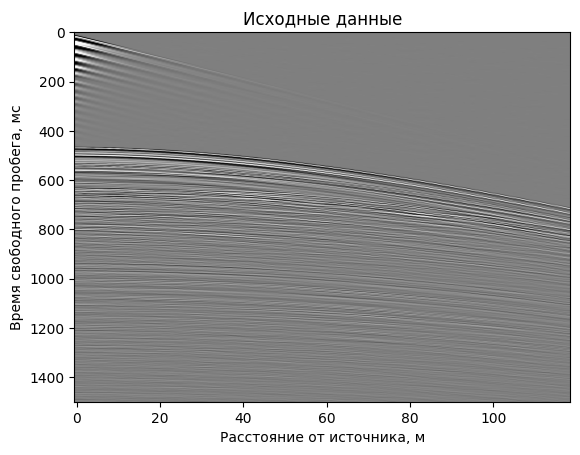

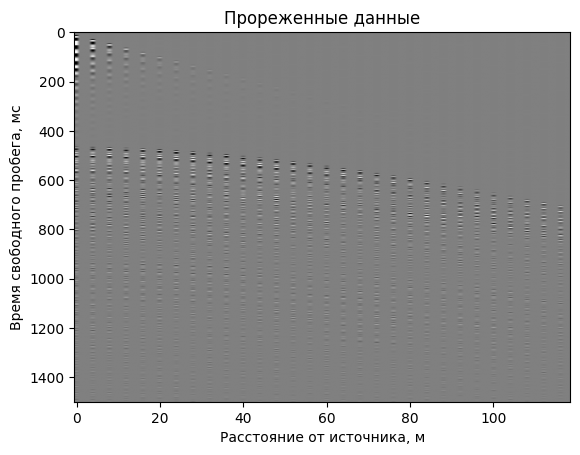

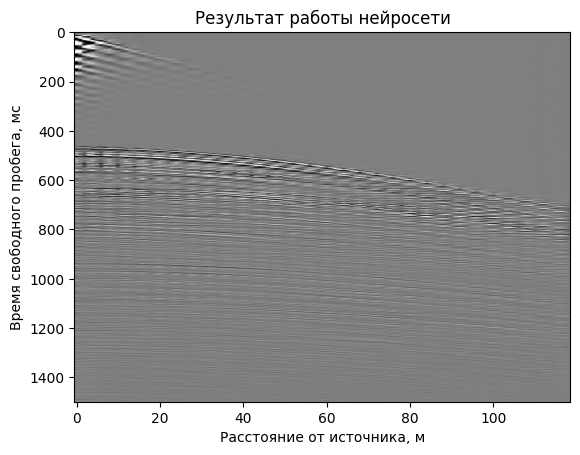

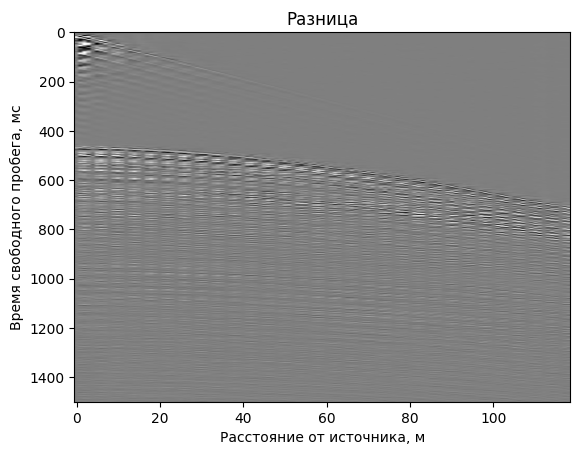

In [3]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

def preprocess_seismic_data(seismic_data, nsub, noise_level=0.1):
    """
    Preprocess seismic data by adding noise and subsampling traces.
    
    Parameters:
        seismic_data (np.ndarray): Original seismic data array.
        nsub (int): Subsampling factor. From every 'nsub' traces, only one is kept.
        noise_level (float): Standard deviation of the Gaussian noise to be added.
        
    Returns:
        np.ndarray: Preprocessed seismic data.
    """
    # Add Gaussian noise
    noise = np.random.normal(0, noise_level * np.std(seismic_data), seismic_data.shape)
    noisy_data = seismic_data + noise
    
    # Subsample traces by zeroing out
    kept_traces = np.arange(0, noisy_data.shape[1], nsub)
    subsampled_data = noisy_data.copy()
    for trace_idx in range(subsampled_data.shape[1]):
        if trace_idx not in kept_traces:
            subsampled_data[:, trace_idx] = 0
    
    return subsampled_data

# Load clear seismic data
x = np.load('test_data/csg2.npy')
x = x.astype(np.float64)

# Define preprocessing parameters
nsub = 4  # From every 4 traces, keep 1
noise_level = 0  # 10% of data's standard deviation

# Preprocess the seismic data
y = preprocess_seismic_data(x, nsub, noise_level)

# Save the preprocessed data if needed
np.save('test_data/new_noise_and_miss.npy', y)

if __name__ == '__main__':
    model = torch.load('trained_model/model.pth')
    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    # Load the same clean data used for preprocessing
    x = np.load('test_data/csg2.npy')
    x = x.astype(np.float64)

    y = np.load('test_data/new_noise_and_miss.npy')

    # Ensure y has the same shape as x
    assert y.shape == x.shape, "Shapes of x and y do not match."

    # Create input tensor with batch and channel dimensions
    y_ = torch.from_numpy(y).unsqueeze(0).unsqueeze(1)  # Shape: (1, 1, height, width)

    # Get window size from the model or define it
    window_size = 8

    # Calculate padding for height and width
    batch_size, channels, height, width = y_.shape
    pad_height = (window_size - height % window_size) % window_size
    pad_width = (window_size - width % window_size) % window_size

    # Pad the tensor
    y_padded = F.pad(y_, (0, pad_width, 0, pad_height), mode='constant', value=0)

    # Proceed with the rest of the code
    torch.cuda.synchronize()
    start_time = time.time()
    y_padded = y_padded.type(torch.float32)
    y_padded = y_padded.cuda()

    x_ = model(y_padded)  # Inferences

    # Remove padding if necessary
    x_ = x_[:, :, :height, :width]

    x_ = x_.squeeze(0).squeeze(0).cpu().detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    # Calculate SNR and SSIM
    pre_snr = snr_(y, x)
    print("Before SNR: ", pre_snr)
    snr = snr_(x_, x)
    print("After SNR: ", snr)

    pre_ssim = ssim_(y, x, data_range=1.0)
    print("Before SSIM: ", pre_ssim)
    ssim = ssim_(x_, x, data_range=1.0)
    print("After SSIM: ", ssim)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Plot the data
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_10092\1020294673.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model/model.pth')


Before SNR:  2.6155548097161447
After SNR:  2.9306503662535874
Before SSIM:  0.5710792739180357
After SSIM:  0.526121344475639
MSE between original and denoised data:  18.09269042525306


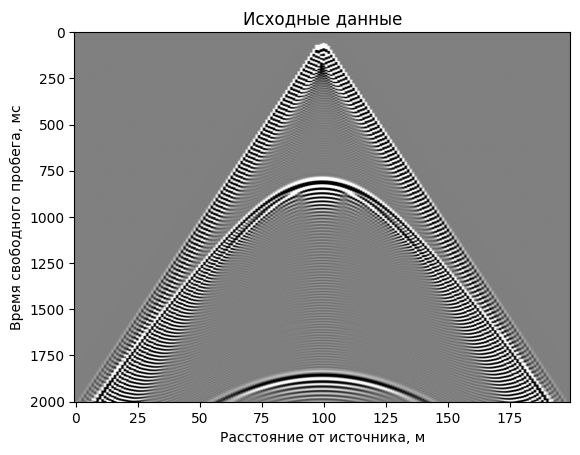

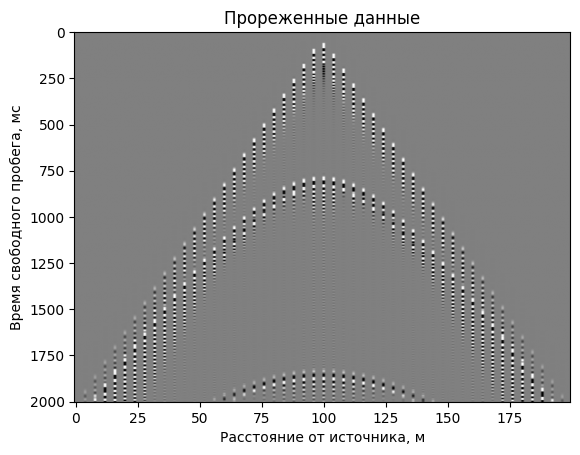

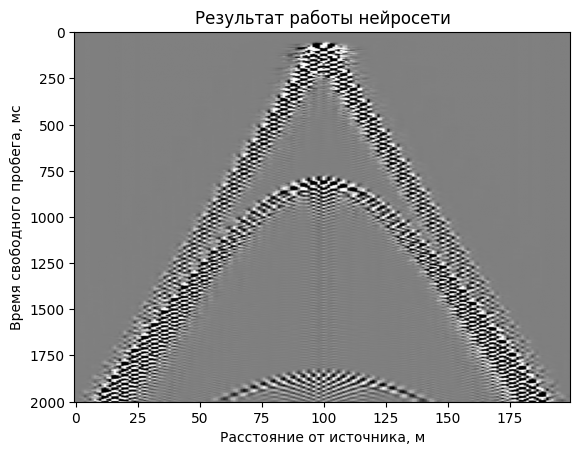

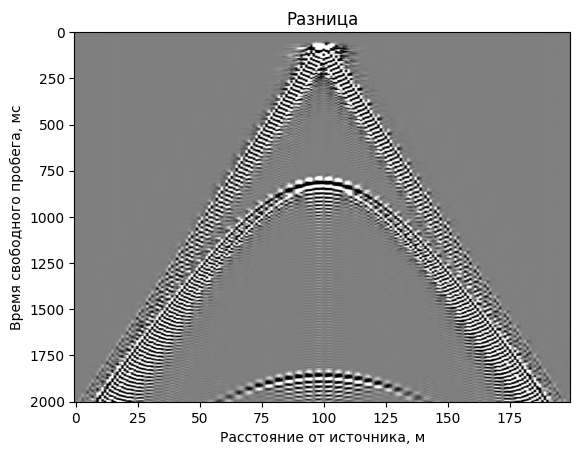

In [4]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

def preprocess_seismic_data(seismic_data, nsub, noise_level=0.1):
    """
    Preprocess seismic data by adding noise and subsampling traces.
    
    Parameters:
        seismic_data (np.ndarray): Original seismic data array.
        nsub (int): Subsampling factor. From every 'nsub' traces, only one is kept.
        noise_level (float): Standard deviation of the Gaussian noise to be added.
        
    Returns:
        np.ndarray: Preprocessed seismic data.
    """
    # Add Gaussian noise
    noise = np.random.normal(0, noise_level * np.std(seismic_data), seismic_data.shape)
    noisy_data = seismic_data + noise
    
    # Subsample traces by zeroing out
    kept_traces = np.arange(0, noisy_data.shape[1], nsub)
    subsampled_data = noisy_data.copy()
    for trace_idx in range(subsampled_data.shape[1]):
        if trace_idx not in kept_traces:
            subsampled_data[:, trace_idx] = 0
    
    return subsampled_data

# Load clear seismic data
x = np.load('test_data/data_25m_horiz.npy')
x = x.astype(np.float64)

# Define preprocessing parameters
nsub = 4  # From every 4 traces, keep 1
noise_level = 0  # 10% of data's standard deviation

# Preprocess the seismic data
y = preprocess_seismic_data(x, nsub, noise_level)

# Save the preprocessed data if needed
np.save('test_data/new_noise_and_miss.npy', y)

if __name__ == '__main__':
    model = torch.load('trained_model/model.pth')
    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    # Load the same clean data used for preprocessing
    x = np.load('test_data/data_25m_horiz.npy')
    x = x.astype(np.float64)

    y = np.load('test_data/new_noise_and_miss.npy')

    # Ensure y has the same shape as x
    assert y.shape == x.shape, "Shapes of x and y do not match."

    # Create input tensor with batch and channel dimensions
    y_ = torch.from_numpy(y).unsqueeze(0).unsqueeze(1)  # Shape: (1, 1, height, width)

    # Get window size from the model or define it
    window_size = 8

    # Calculate padding for height and width
    batch_size, channels, height, width = y_.shape
    pad_height = (window_size - height % window_size) % window_size
    pad_width = (window_size - width % window_size) % window_size

    # Pad the tensor
    y_padded = F.pad(y_, (0, pad_width, 0, pad_height), mode='constant', value=0)

    # Proceed with the rest of the code
    torch.cuda.synchronize()
    start_time = time.time()
    y_padded = y_padded.type(torch.float32)
    y_padded = y_padded.cuda()

    x_ = model(y_padded)  # Inferences

    # Remove padding if necessary
    x_ = x_[:, :, :height, :width]

    x_ = x_.squeeze(0).squeeze(0).cpu().detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    # Calculate SNR and SSIM
    pre_snr = snr_(y, x)
    print("Before SNR: ", pre_snr)
    snr = snr_(x_, x)
    print("After SNR: ", snr)

    pre_ssim = ssim_(y, x, data_range=1.0)
    print("Before SSIM: ", pre_ssim)
    ssim = ssim_(x_, x, data_range=1.0)
    print("After SSIM: ", ssim)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Plot the data
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_21136\3235291694.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model/model.pth')


Before SNR:  6.064876083440134
After SNR:  19.13088766036909
Before SSIM:  0.553894042447038
After SSIM:  0.934880946838693
MSE between original and denoised data:  0.0004420773589721551


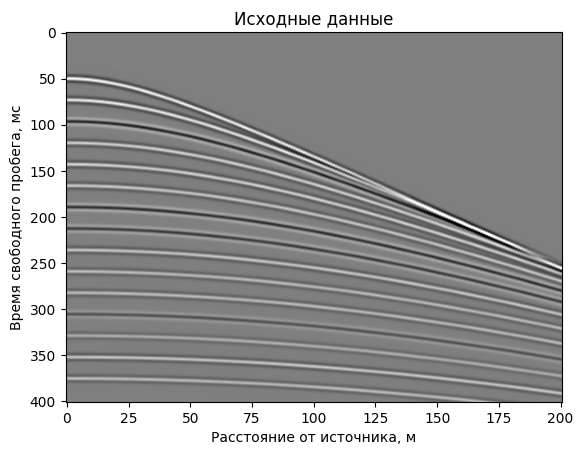

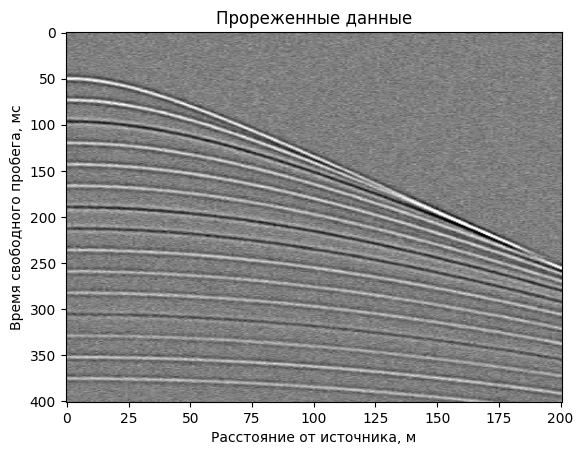

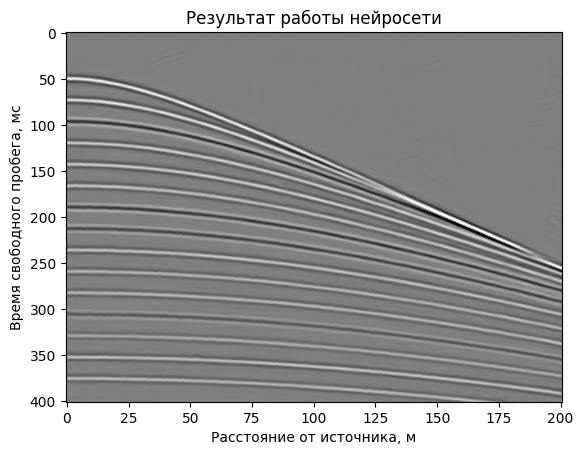

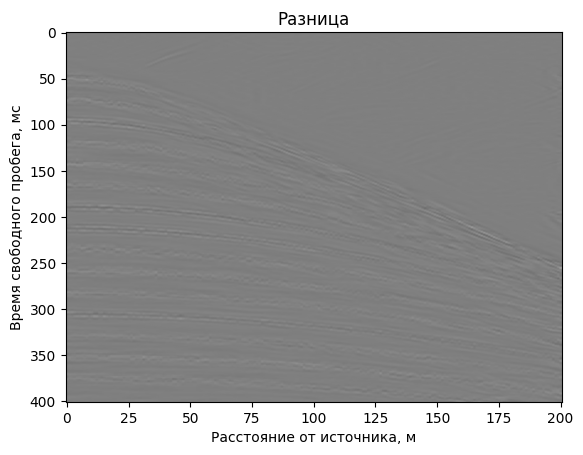

In [5]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

def preprocess_seismic_data(seismic_data, nsub, noise_level=0.1):
    """
    Preprocess seismic data by adding noise and subsampling traces.

    Parameters:
        seismic_data (np.ndarray): Original seismic data array.
        nsub (int): Subsampling factor. From every 'nsub' traces, only one is kept.
        noise_level (float): Standard deviation of the Gaussian noise to be added.

    Returns:
        np.ndarray: Preprocessed seismic data.
    """
    # Add Gaussian noise
    noise = np.random.normal(0, noise_level * np.std(seismic_data), seismic_data.shape)
    noisy_data = seismic_data + noise

    # Subsample traces by zeroing out
    kept_traces = np.arange(0, noisy_data.shape[1], nsub)
    subsampled_data = noisy_data.copy()
    for trace_idx in range(subsampled_data.shape[1]):
        if trace_idx not in kept_traces:
            subsampled_data[:, trace_idx] = 0

    return subsampled_data

# Load clear seismic data
x = np.load('test_data/data_dense.npy').T
x = x.astype(np.float64)

# Define preprocessing parameters
nsub = 1  # From every 4 traces, keep 1
noise_level = 0.5  # 10% of data's standard deviation

# Preprocess the seismic data
y = preprocess_seismic_data(x, nsub, noise_level)

# Save the preprocessed data if needed
np.save('test_data/new_noise_and_miss.npy', y)

if __name__ == '__main__':
    model = torch.load('trained_model/model.pth')
    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    # Load the same clean data used for preprocessing
    x = np.load('test_data/data_dense.npy').T
    x = x.astype(np.float64)

    y = np.load('test_data/new_noise_and_miss.npy')

    # Ensure y has the same shape as x
    assert y.shape == x.shape, "Shapes of x and y do not match."

    # Create input tensor with batch and channel dimensions
    y_ = torch.from_numpy(y).unsqueeze(0).unsqueeze(1)  # Shape: (1, 1, height, width)

    # Get window size from the model or define it
    window_size = 8

    # Calculate padding for height and width
    batch_size, channels, height, width = y_.shape
    pad_height = (window_size - height % window_size) % window_size
    pad_width = (window_size - width % window_size) % window_size

    # Pad the tensor
    y_padded = F.pad(y_, (0, pad_width, 0, pad_height), mode='constant', value=0)

    # Proceed with the rest of the code
    torch.cuda.synchronize()
    start_time = time.time()
    y_padded = y_padded.type(torch.float32)
    y_padded = y_padded.cuda()

    x_ = model(y_padded)  # Inferences

    # Remove padding if necessary
    x_ = x_[:, :, :height, :width]

    x_ = x_.squeeze(0).squeeze(0).cpu().detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    # Calculate SNR and SSIM
    pre_snr = snr_(y, x)
    print("Before SNR: ", pre_snr)
    snr = snr_(x_, x)
    print("After SNR: ", snr)

    pre_ssim = ssim_(y, x, data_range=1.0)
    print("Before SSIM: ", pre_ssim)
    ssim = ssim_(x_, x, data_range=1.0)
    print("After SSIM: ", ssim)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Plot the data
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_21136\577770363.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model/model.pth')


Before SNR:  -6.046610073615048
After SNR:  5.8348062467551625
Before SSIM:  0.1127206138779346
After SSIM:  0.4267555415213393
MSE between original and denoised data:  0.009442922261970937


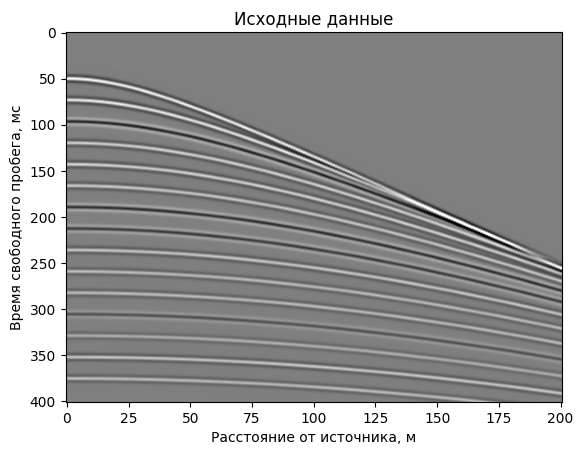

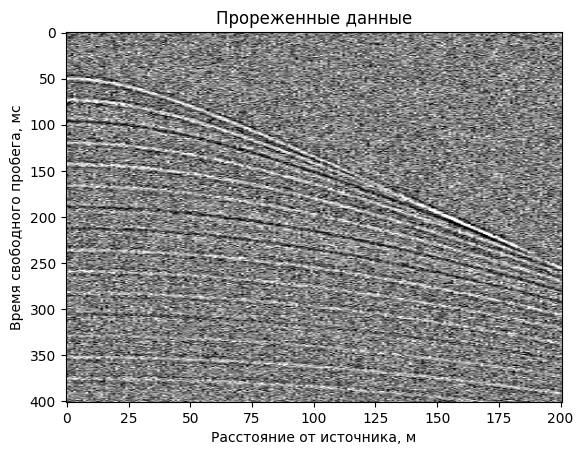

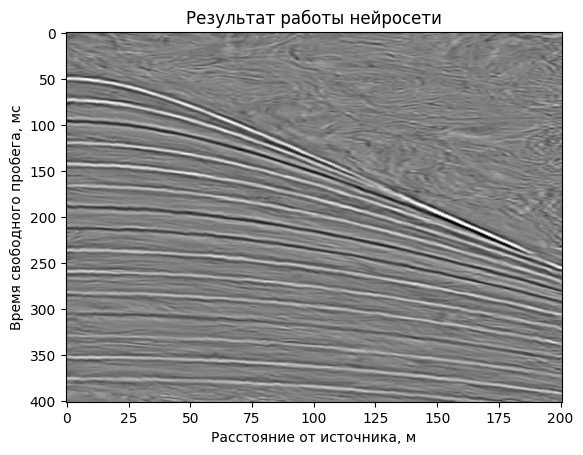

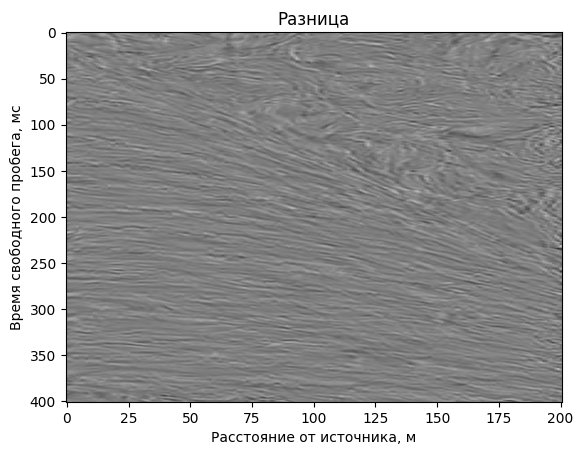

In [4]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

def preprocess_seismic_data(seismic_data, nsub, noise_level=0.1):
    """
    Preprocess seismic data by adding noise and subsampling traces.
    
    Parameters:
        seismic_data (np.ndarray): Original seismic data array.
        nsub (int): Subsampling factor. From every 'nsub' traces, only one is kept.
        noise_level (float): Standard deviation of the Gaussian noise to be added.
        
    Returns:
        np.ndarray: Preprocessed seismic data.
    """
    # Add Gaussian noise
    noise = np.random.normal(0, noise_level * np.std(seismic_data), seismic_data.shape)
    noisy_data = seismic_data + noise
    
    # Subsample traces by zeroing out
    kept_traces = np.arange(0, noisy_data.shape[1], nsub)
    subsampled_data = noisy_data.copy()
    for trace_idx in range(subsampled_data.shape[1]):
        if trace_idx not in kept_traces:
            subsampled_data[:, trace_idx] = 0
    
    return subsampled_data

# Load clear seismic data
x = np.load('test_data/data_dense.npy').T
x = x.astype(np.float64)

# Define preprocessing parameters
nsub = 1  # From every 4 traces, keep 1
noise_level = 2  # 10% of data's standard deviation

# Preprocess the seismic data
y = preprocess_seismic_data(x, nsub, noise_level)

# Save the preprocessed data if needed
np.save('test_data/new_noise_and_miss.npy', y)

if __name__ == '__main__':
    model = torch.load('trained_model/model.pth')
    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    # Load the same clean data used for preprocessing
    x = np.load('test_data/data_dense.npy').T
    x = x.astype(np.float64)

    y = np.load('test_data/new_noise_and_miss.npy')

    # Ensure y has the same shape as x
    assert y.shape == x.shape, "Shapes of x and y do not match."

    # Create input tensor with batch and channel dimensions
    y_ = torch.from_numpy(y).unsqueeze(0).unsqueeze(1)  # Shape: (1, 1, height, width)

    # Get window size from the model or define it
    window_size = 8

    # Calculate padding for height and width
    batch_size, channels, height, width = y_.shape
    pad_height = (window_size - height % window_size) % window_size
    pad_width = (window_size - width % window_size) % window_size

    # Pad the tensor
    y_padded = F.pad(y_, (0, pad_width, 0, pad_height), mode='constant', value=0)

    # Proceed with the rest of the code
    torch.cuda.synchronize()
    start_time = time.time()
    y_padded = y_padded.type(torch.float32)
    y_padded = y_padded.cuda()

    x_ = model(y_padded)  # Inferences

    # Remove padding if necessary
    x_ = x_[:, :, :height, :width]

    x_ = x_.squeeze(0).squeeze(0).cpu().detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    # Calculate SNR and SSIM
    pre_snr = snr_(y, x)
    print("Before SNR: ", pre_snr)
    snr = snr_(x_, x)
    print("After SNR: ", snr)

    pre_ssim = ssim_(y, x, data_range=1.0)
    print("Before SSIM: ", pre_ssim)
    ssim = ssim_(x_, x, data_range=1.0)
    print("After SSIM: ", ssim)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Plot the data
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-1, vmax=1)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_10092\2669420721.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model/model.pth')


Before SNR:  1.2725239798611647
After SNR:  9.677681992249717
Before SSIM:  0.5012775020753586
After SSIM:  0.8710496604527126
MSE between original and denoised data:  0.0038977936150827817
MSE between original and denoised data:  0.0038977936150827817


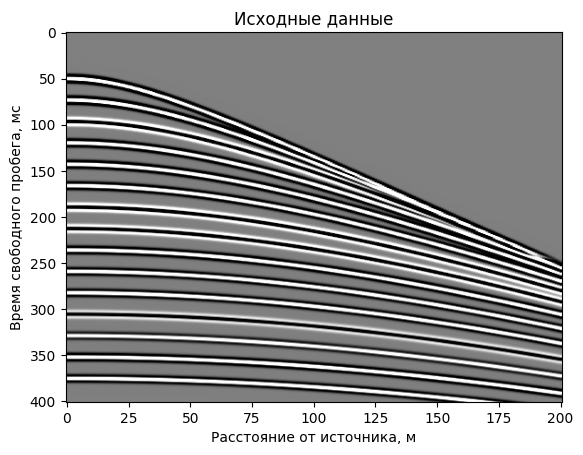

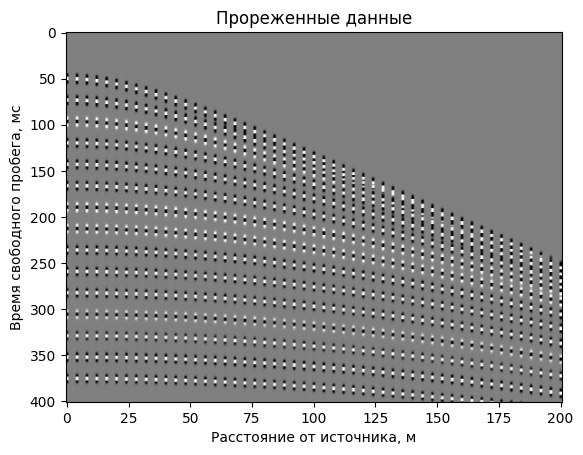

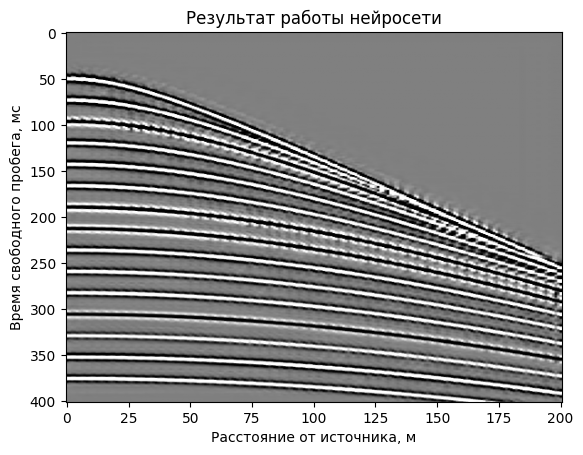

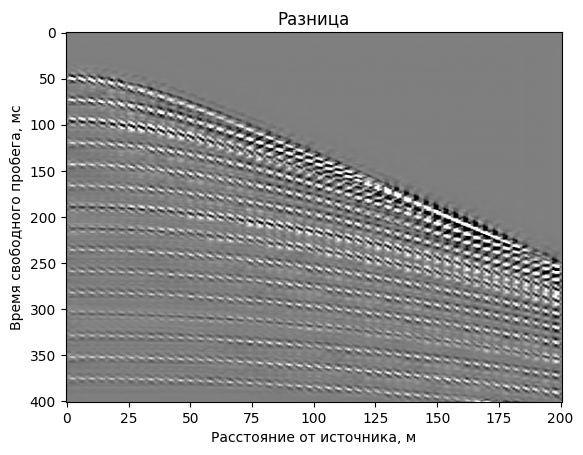

In [6]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

def preprocess_seismic_data(seismic_data, nsub, noise_level=0.1):
    """
    Preprocess seismic data by adding noise and subsampling traces.

    Parameters:
        seismic_data (np.ndarray): Original seismic data array.
        nsub (int): Subsampling factor. From every 'nsub' traces, only one is kept.
        noise_level (float): Standard deviation of the Gaussian noise to be added.

    Returns:
        np.ndarray: Preprocessed seismic data.
    """
    # Add Gaussian noise
    noise = np.random.normal(0, noise_level * np.std(seismic_data), seismic_data.shape)
    noisy_data = seismic_data + noise

    # Subsample traces by zeroing out
    kept_traces = np.arange(0, noisy_data.shape[1], nsub)
    subsampled_data = noisy_data.copy()
    for trace_idx in range(subsampled_data.shape[1]):
        if trace_idx not in kept_traces:
            subsampled_data[:, trace_idx] = 0

    return subsampled_data

# Load clear seismic data
x = np.load('test_data/data_dense.npy').T
x = x.astype(np.float64)

# Define preprocessing parameters
nsub = 4  # From every 5 traces, keep 1
noise_level = 0  # No noise added

# Preprocess the seismic data
y = preprocess_seismic_data(x, nsub, noise_level)

# Save the preprocessed data if needed
np.save('test_data/new_noise_and_miss.npy', y)

if __name__ == '__main__':
    model = torch.load('trained_model/model.pth')
    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    # Load the same clean data used for preprocessing
    x = np.load('test_data/data_dense.npy').T
    x = x.astype(np.float64)

    y = np.load('test_data/new_noise_and_miss.npy')

    # Ensure y has the same shape as x
    assert y.shape == x.shape, "Shapes of x and y do not match."

    # Create input tensor with batch and channel dimensions
    y_ = torch.from_numpy(y).unsqueeze(0).unsqueeze(1)  # Shape: (1, 1, height, width)

    # Get window size from the model or define it
    window_size = 8

    # Calculate padding for height and width
    batch_size, channels, height, width = y_.shape
    pad_height = (window_size - height % window_size) % window_size
    pad_width = (window_size - width % window_size) % window_size

    # Pad the tensor
    y_padded = F.pad(y_, (0, pad_width, 0, pad_height), mode='constant', value=0)

    # Proceed with the rest of the code
    torch.cuda.synchronize()
    start_time = time.time()
    y_padded = y_padded.type(torch.float32)
    y_padded = y_padded.cuda()

    x_ = model(y_padded)  # Inferences

    # Remove padding if necessary
    x_ = x_[:, :, :height, :width]

    x_ = x_.squeeze(0).squeeze(0).cpu().detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    # Calculate SNR and SSIM
    pre_snr = snr_(y, x)
    print("Before SNR: ", pre_snr)
    snr = snr_(x_, x)
    print("After SNR: ", snr)

    pre_ssim = ssim_(y, x, data_range=1.0)
    print("Before SSIM: ", pre_ssim)
    ssim = ssim_(x_, x, data_range=1.0)
    print("After SSIM: ", ssim)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Plot the data
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_21136\2468857137.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model/model.pth')


Before SNR:  0.8023645579081996
After SNR:  1.1459773698540368
Before SSIM:  0.42918005104739765
After SSIM:  0.4406306137822265
MSE between original and denoised data:  0.027796447964104822
MSE between original and denoised data:  0.027796447964104822


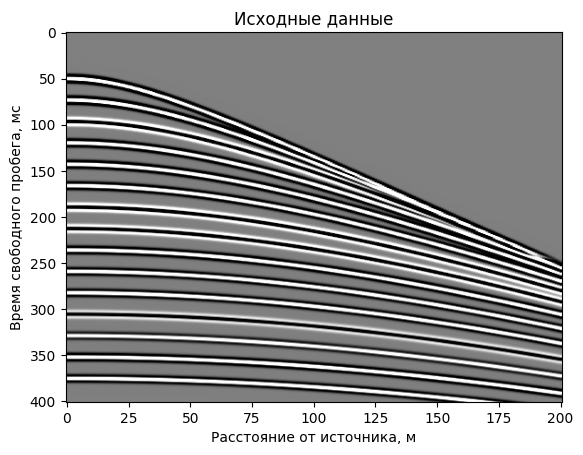

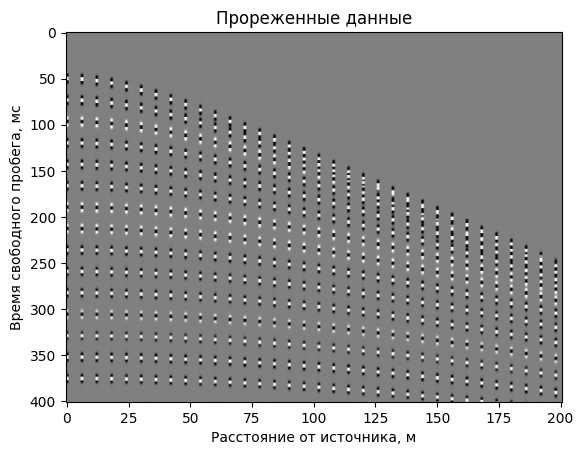

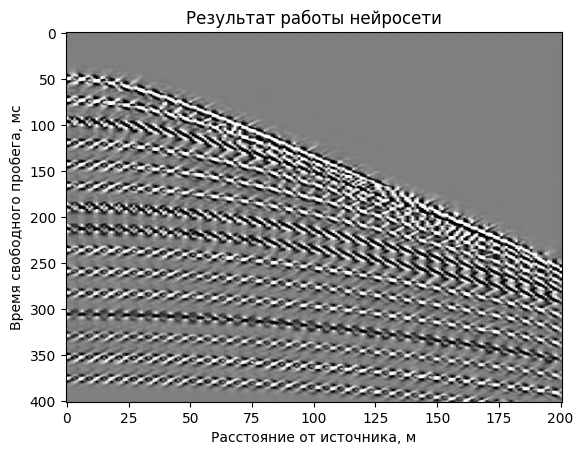

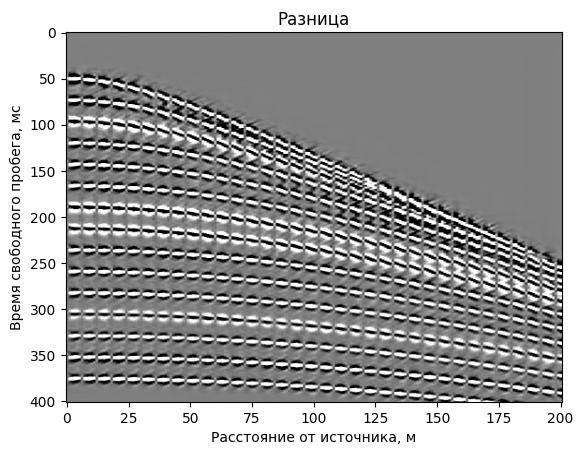

In [6]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

def preprocess_seismic_data(seismic_data, nsub, noise_level=0.1):
    """
    Preprocess seismic data by adding noise and subsampling traces.

    Parameters:
        seismic_data (np.ndarray): Original seismic data array.
        nsub (int): Subsampling factor. From every 'nsub' traces, only one is kept.
        noise_level (float): Standard deviation of the Gaussian noise to be added.

    Returns:
        np.ndarray: Preprocessed seismic data.
    """
    # Add Gaussian noise
    noise = np.random.normal(0, noise_level * np.std(seismic_data), seismic_data.shape)
    noisy_data = seismic_data + noise

    # Subsample traces by zeroing out
    kept_traces = np.arange(0, noisy_data.shape[1], nsub)
    subsampled_data = noisy_data.copy()
    for trace_idx in range(subsampled_data.shape[1]):
        if trace_idx not in kept_traces:
            subsampled_data[:, trace_idx] = 0

    return subsampled_data

# Load clear seismic data
x = np.load('test_data/data_dense.npy').T
x = x.astype(np.float64)

# Define preprocessing parameters
nsub = 6  # From every 5 traces, keep 1
noise_level = 0  # No noise added

# Preprocess the seismic data
y = preprocess_seismic_data(x, nsub, noise_level)

# Save the preprocessed data if needed
np.save('test_data/new_noise_and_miss.npy', y)

if __name__ == '__main__':
    model = torch.load('trained_model/model.pth')
    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    # Load the same clean data used for preprocessing
    x = np.load('test_data/data_dense.npy').T
    x = x.astype(np.float64)

    y = np.load('test_data/new_noise_and_miss.npy')

    # Ensure y has the same shape as x
    assert y.shape == x.shape, "Shapes of x and y do not match."

    # Create input tensor with batch and channel dimensions
    y_ = torch.from_numpy(y).unsqueeze(0).unsqueeze(1)  # Shape: (1, 1, height, width)

    # Get window size from the model or define it
    window_size = 8

    # Calculate padding for height and width
    batch_size, channels, height, width = y_.shape
    pad_height = (window_size - height % window_size) % window_size
    pad_width = (window_size - width % window_size) % window_size

    # Pad the tensor
    y_padded = F.pad(y_, (0, pad_width, 0, pad_height), mode='constant', value=0)

    # Proceed with the rest of the code
    torch.cuda.synchronize()
    start_time = time.time()
    y_padded = y_padded.type(torch.float32)
    y_padded = y_padded.cuda()

    x_ = model(y_padded)  # Inferences

    # Remove padding if necessary
    x_ = x_[:, :, :height, :width]

    x_ = x_.squeeze(0).squeeze(0).cpu().detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    # Calculate SNR and SSIM
    pre_snr = snr_(y, x)
    print("Before SNR: ", pre_snr)
    snr = snr_(x_, x)
    print("After SNR: ", snr)

    pre_ssim = ssim_(y, x, data_range=1.0)
    print("Before SSIM: ", pre_ssim)
    ssim = ssim_(x_, x, data_range=1.0)
    print("After SSIM: ", ssim)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Plot the data
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

Before SNR:  0.6009200074198559
After SNR:  -0.37150405804601094
Before SSIM:  0.39528968113425683
After SSIM:  0.3368631752658364
MSE between original and denoised data:  0.03942189028205905
MSE between original and denoised data:  0.03942189028205905


C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_10092\535583061.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model/model.pth')


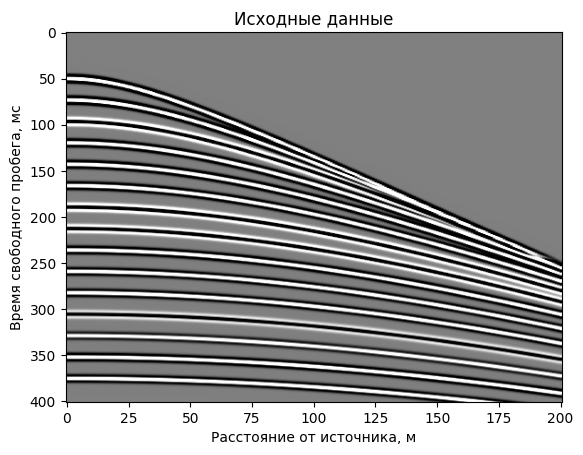

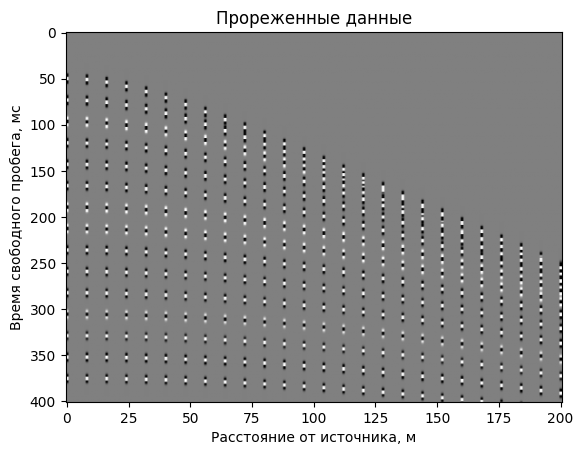

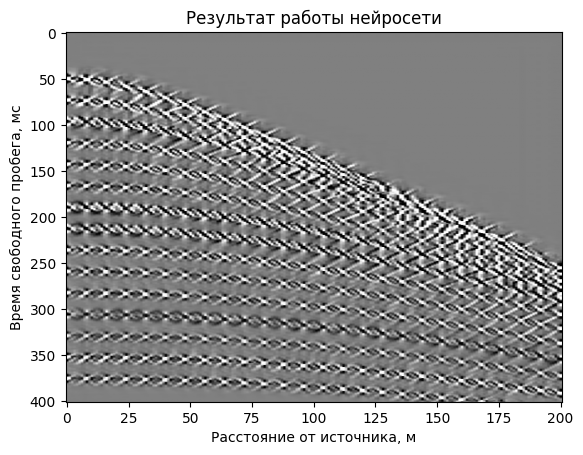

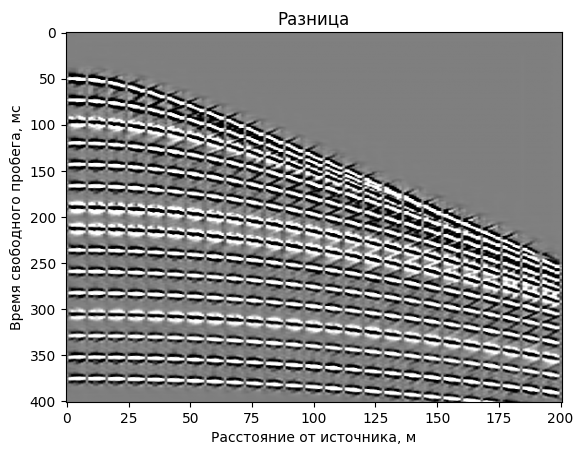

In [7]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

def preprocess_seismic_data(seismic_data, nsub, noise_level=0.1):
    """
    Preprocess seismic data by adding noise and subsampling traces.

    Parameters:
        seismic_data (np.ndarray): Original seismic data array.
        nsub (int): Subsampling factor. From every 'nsub' traces, only one is kept.
        noise_level (float): Standard deviation of the Gaussian noise to be added.

    Returns:
        np.ndarray: Preprocessed seismic data.
    """
    # Add Gaussian noise
    noise = np.random.normal(0, noise_level * np.std(seismic_data), seismic_data.shape)
    noisy_data = seismic_data + noise

    # Subsample traces by zeroing out
    kept_traces = np.arange(0, noisy_data.shape[1], nsub)
    subsampled_data = noisy_data.copy()
    for trace_idx in range(subsampled_data.shape[1]):
        if trace_idx not in kept_traces:
            subsampled_data[:, trace_idx] = 0

    return subsampled_data

# Load clear seismic data
x = np.load('test_data/data_dense.npy').T
x = x.astype(np.float64)

# Define preprocessing parameters
nsub = 8  # From every 5 traces, keep 1
noise_level = 0  # No noise added

# Preprocess the seismic data
y = preprocess_seismic_data(x, nsub, noise_level)

# Save the preprocessed data if needed
np.save('test_data/new_noise_and_miss.npy', y)

if __name__ == '__main__':
    model = torch.load('trained_model/model.pth')
    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    # Load the same clean data used for preprocessing
    x = np.load('test_data/data_dense.npy').T
    x = x.astype(np.float64)

    y = np.load('test_data/new_noise_and_miss.npy')

    # Ensure y has the same shape as x
    assert y.shape == x.shape, "Shapes of x and y do not match."

    # Create input tensor with batch and channel dimensions
    y_ = torch.from_numpy(y).unsqueeze(0).unsqueeze(1)  # Shape: (1, 1, height, width)

    # Get window size from the model or define it
    window_size = 8

    # Calculate padding for height and width
    batch_size, channels, height, width = y_.shape
    pad_height = (window_size - height % window_size) % window_size
    pad_width = (window_size - width % window_size) % window_size

    # Pad the tensor
    y_padded = F.pad(y_, (0, pad_width, 0, pad_height), mode='constant', value=0)

    # Proceed with the rest of the code
    torch.cuda.synchronize()
    start_time = time.time()
    y_padded = y_padded.type(torch.float32)
    y_padded = y_padded.cuda()

    x_ = model(y_padded)  # Inferences

    # Remove padding if necessary
    x_ = x_[:, :, :height, :width]

    x_ = x_.squeeze(0).squeeze(0).cpu().detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    # Calculate SNR and SSIM
    pre_snr = snr_(y, x)
    print("Before SNR: ", pre_snr)
    snr = snr_(x_, x)
    print("After SNR: ", snr)

    pre_ssim = ssim_(y, x, data_range=1.0)
    print("Before SSIM: ", pre_ssim)
    ssim = ssim_(x_, x, data_range=1.0)
    print("After SSIM: ", ssim)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Plot the data
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_10092\1974293150.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model/model.pth')


Before SNR:  6.039284494085373
After SNR:  11.386387562838596
Before SSIM:  0.6427722326449651
After SSIM:  0.9328261446766953
MSE between original and denoised data:  0.00037165630747141974


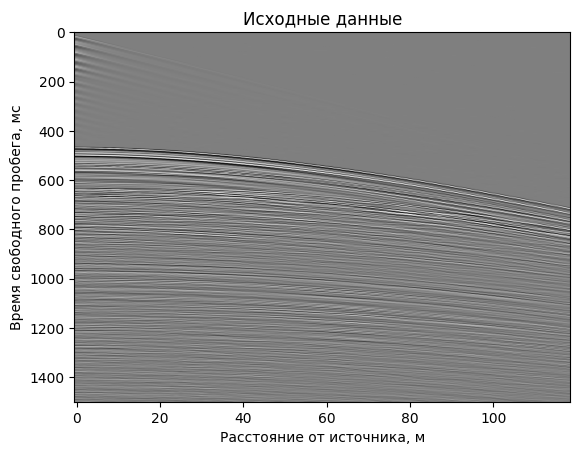

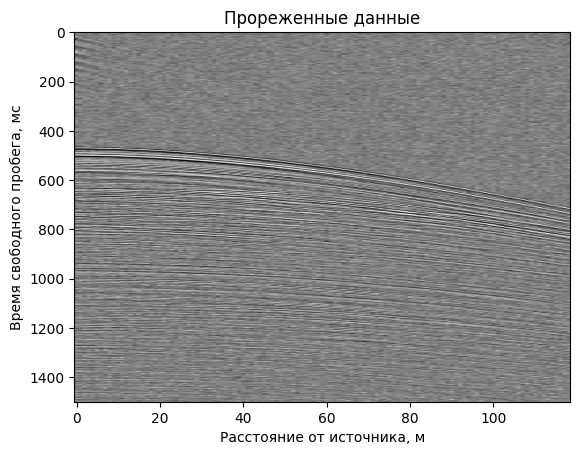

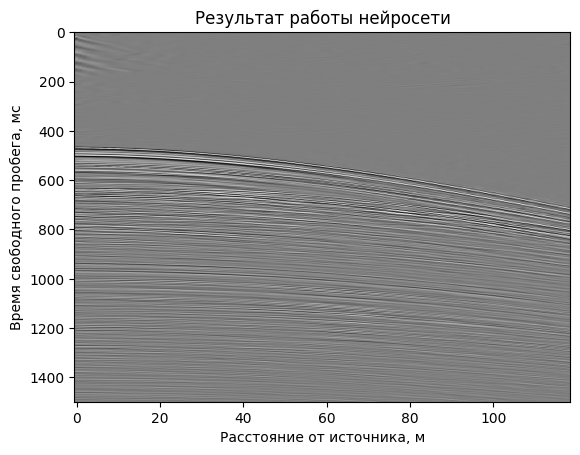

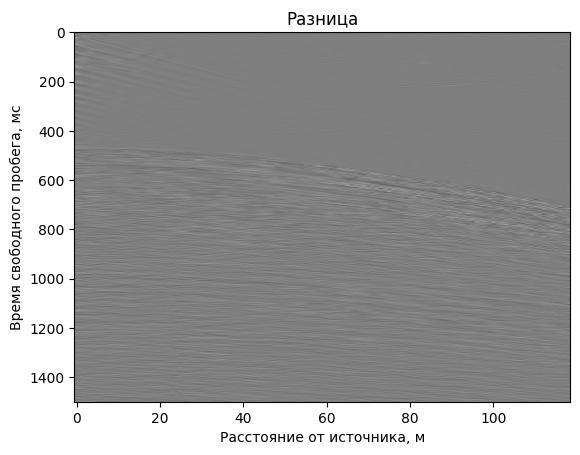

In [8]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

def preprocess_seismic_data(seismic_data, nsub, noise_level=0.1):
    """
    Preprocess seismic data by adding noise and subsampling traces.

    Parameters:
        seismic_data (np.ndarray): Original seismic data array.
        nsub (int): Subsampling factor. From every 'nsub' traces, only one is kept.
        noise_level (float): Standard deviation of the Gaussian noise to be added.

    Returns:
        np.ndarray: Preprocessed seismic data.
    """
    # Add Gaussian noise
    noise = np.random.normal(0, noise_level * np.std(seismic_data), seismic_data.shape)
    noisy_data = seismic_data + noise

    # Subsample traces by zeroing out
    kept_traces = np.arange(0, noisy_data.shape[1], nsub)
    subsampled_data = noisy_data.copy()
    for trace_idx in range(subsampled_data.shape[1]):
        if trace_idx not in kept_traces:
            subsampled_data[:, trace_idx] = 0

    return subsampled_data

# Load clear seismic data
x = np.load('test_data/GOMgain.npy')
x = x.astype(np.float64)

# Define preprocessing parameters
nsub = 1  # From every 5 traces, keep 1
noise_level = 0.5  # No noise added

# Preprocess the seismic data
y = preprocess_seismic_data(x, nsub, noise_level)

# Save the preprocessed data if needed
np.save('test_data/new_noise_and_miss.npy', y)

if __name__ == '__main__':
    model = torch.load('trained_model/model.pth')
    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    # Load the same clean data used for preprocessing
    x = np.load('test_data/GOMgain.npy')
    x = x.astype(np.float64)

    y = np.load('test_data/new_noise_and_miss.npy')

    # Ensure y has the same shape as x
    assert y.shape == x.shape, "Shapes of x and y do not match."

    # Create input tensor with batch and channel dimensions
    y_ = torch.from_numpy(y).unsqueeze(0).unsqueeze(1)  # Shape: (1, 1, height, width)

    # Get window size from the model or define it
    window_size = 8

    # Calculate padding for height and width
    batch_size, channels, height, width = y_.shape
    pad_height = (window_size - height % window_size) % window_size
    pad_width = (window_size - width % window_size) % window_size

    # Pad the tensor
    y_padded = F.pad(y_, (0, pad_width, 0, pad_height), mode='constant', value=0)

    # Proceed with the rest of the code
    torch.cuda.synchronize()
    start_time = time.time()
    y_padded = y_padded.type(torch.float32)
    y_padded = y_padded.cuda()

    x_ = model(y_padded)  # Inferences

    # Remove padding if necessary
    x_ = x_[:, :, :height, :width]

    x_ = x_.squeeze(0).squeeze(0).cpu().detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    # Calculate SNR and SSIM
    pre_snr = snr_(y, x)
    print("Before SNR: ", pre_snr)
    snr = snr_(x_, x)
    print("After SNR: ", snr)

    pre_ssim = ssim_(y, x, data_range=1.0)
    print("Before SSIM: ", pre_ssim)
    ssim = ssim_(x_, x, data_range=1.0)
    print("After SSIM: ", ssim)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Plot the data
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()
    plt.show()

C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_21136\1270334763.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model/model.pth')


Before SNR:  0.0059366410646627355
After SNR:  8.715750466002667
Before SSIM:  0.36008170508934234
After SSIM:  0.8660265581923332
MSE between original and denoised data:  0.0006873931775509536


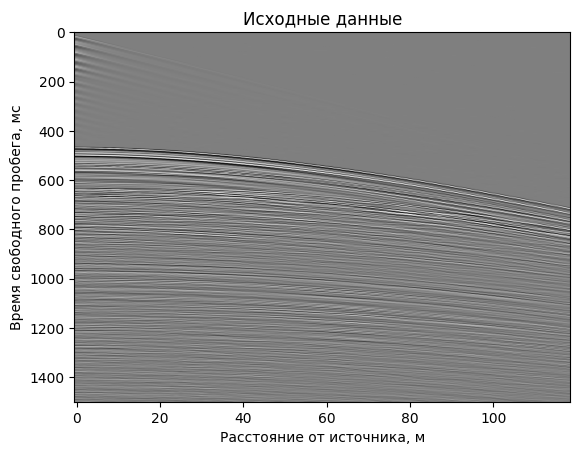

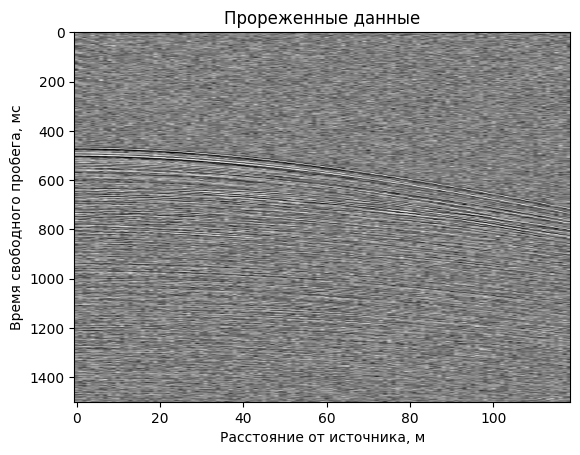

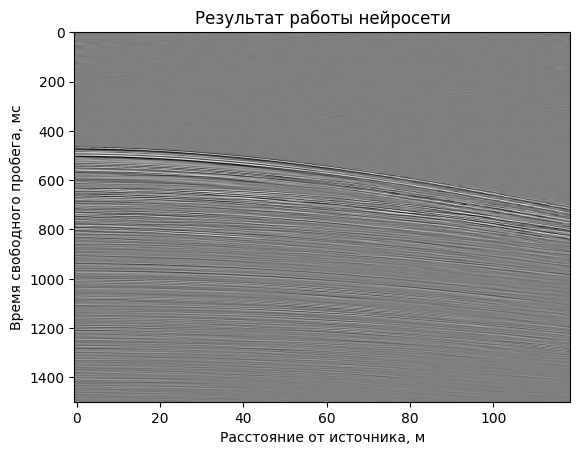

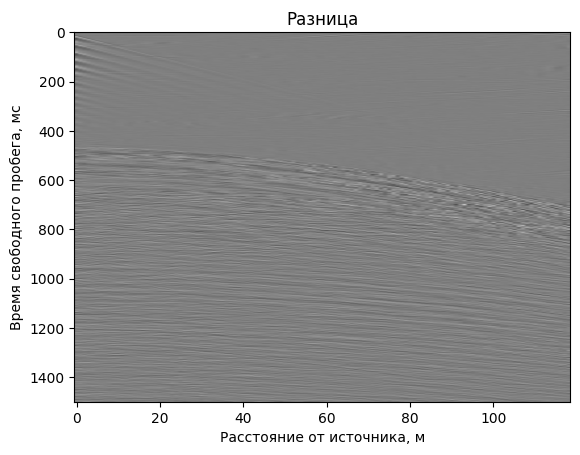

In [8]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

def preprocess_seismic_data(seismic_data, nsub, noise_level=0.1):
    """
    Preprocess seismic data by adding noise and subsampling traces.

    Parameters:
        seismic_data (np.ndarray): Original seismic data array.
        nsub (int): Subsampling factor. From every 'nsub' traces, only one is kept.
        noise_level (float): Standard deviation of the Gaussian noise to be added.

    Returns:
        np.ndarray: Preprocessed seismic data.
    """
    # Add Gaussian noise
    noise = np.random.normal(0, noise_level * np.std(seismic_data), seismic_data.shape)
    noisy_data = seismic_data + noise

    # Subsample traces by zeroing out
    kept_traces = np.arange(0, noisy_data.shape[1], nsub)
    subsampled_data = noisy_data.copy()
    for trace_idx in range(subsampled_data.shape[1]):
        if trace_idx not in kept_traces:
            subsampled_data[:, trace_idx] = 0

    return subsampled_data

# Load clear seismic data
x = np.load('test_data/GOMgain.npy')
x = x.astype(np.float64)

# Define preprocessing parameters
nsub = 1  # From every 5 traces, keep 1
noise_level = 1  # No noise added

# Preprocess the seismic data
y = preprocess_seismic_data(x, nsub, noise_level)

# Save the preprocessed data if needed
np.save('test_data/new_noise_and_miss.npy', y)

if __name__ == '__main__':
    model = torch.load('trained_model/model.pth')
    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    # Load the same clean data used for preprocessing
    x = np.load('test_data/GOMgain.npy')
    x = x.astype(np.float64)

    y = np.load('test_data/new_noise_and_miss.npy')

    # Ensure y has the same shape as x
    assert y.shape == x.shape, "Shapes of x and y do not match."

    # Create input tensor with batch and channel dimensions
    y_ = torch.from_numpy(y).unsqueeze(0).unsqueeze(1)  # Shape: (1, 1, height, width)

    # Get window size from the model or define it
    window_size = 8

    # Calculate padding for height and width
    batch_size, channels, height, width = y_.shape
    pad_height = (window_size - height % window_size) % window_size
    pad_width = (window_size - width % window_size) % window_size

    # Pad the tensor
    y_padded = F.pad(y_, (0, pad_width, 0, pad_height), mode='constant', value=0)

    # Proceed with the rest of the code
    torch.cuda.synchronize()
    start_time = time.time()
    y_padded = y_padded.type(torch.float32)
    y_padded = y_padded.cuda()

    x_ = model(y_padded)  # Inferences

    # Remove padding if necessary
    x_ = x_[:, :, :height, :width]

    x_ = x_.squeeze(0).squeeze(0).cpu().detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    # Calculate SNR and SSIM
    pre_snr = snr_(y, x)
    print("Before SNR: ", pre_snr)
    snr = snr_(x_, x)
    print("After SNR: ", snr)

    pre_ssim = ssim_(y, x, data_range=1.0)
    print("Before SSIM: ", pre_ssim)
    ssim = ssim_(x_, x, data_range=1.0)
    print("After SSIM: ", ssim)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Plot the data
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()
    plt.show()

C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_21136\1088044504.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model/model.pth')


Before SNR:  -6.026126819158561
After SNR:  5.650864464226658
Before SSIM:  0.1456262678212135
After SSIM:  0.7422599112805267
MSE between original and denoised data:  0.0013921749581218106


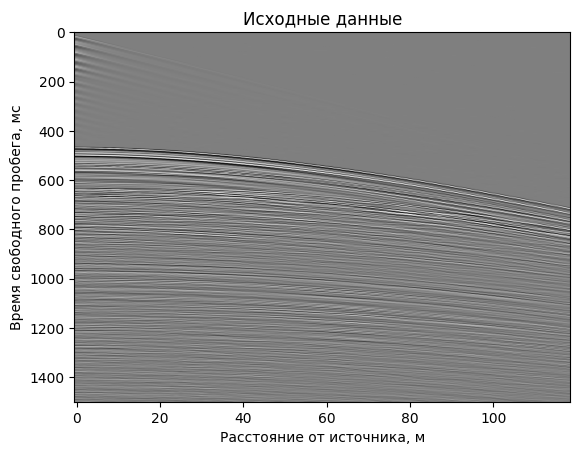

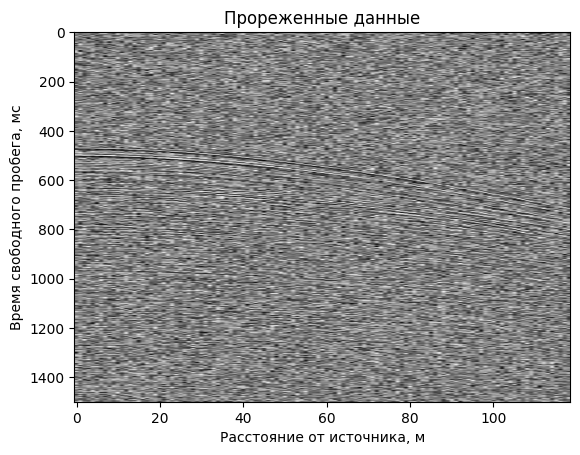

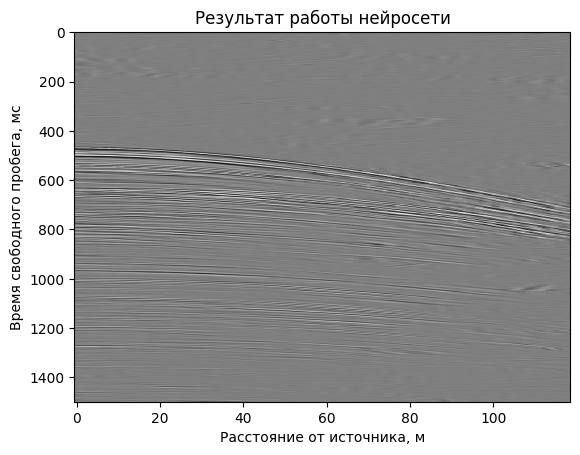

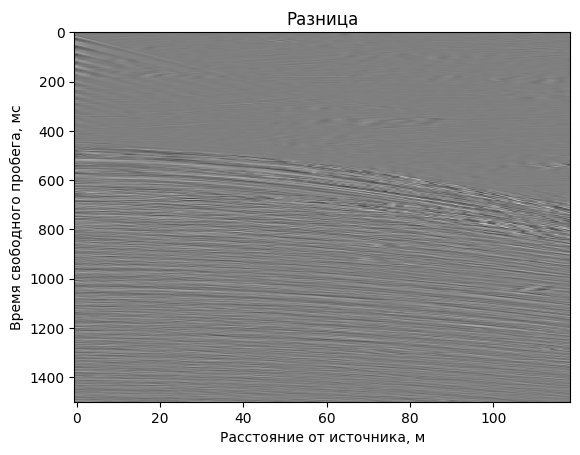

In [9]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

def preprocess_seismic_data(seismic_data, nsub, noise_level=0.1):
    """
    Preprocess seismic data by adding noise and subsampling traces.

    Parameters:
        seismic_data (np.ndarray): Original seismic data array.
        nsub (int): Subsampling factor. From every 'nsub' traces, only one is kept.
        noise_level (float): Standard deviation of the Gaussian noise to be added.

    Returns:
        np.ndarray: Preprocessed seismic data.
    """
    # Add Gaussian noise
    noise = np.random.normal(0, noise_level * np.std(seismic_data), seismic_data.shape)
    noisy_data = seismic_data + noise

    # Subsample traces by zeroing out
    kept_traces = np.arange(0, noisy_data.shape[1], nsub)
    subsampled_data = noisy_data.copy()
    for trace_idx in range(subsampled_data.shape[1]):
        if trace_idx not in kept_traces:
            subsampled_data[:, trace_idx] = 0

    return subsampled_data

# Load clear seismic data
x = np.load('test_data/GOMgain.npy')
x = x.astype(np.float64)

# Define preprocessing parameters
nsub = 1  # From every 5 traces, keep 1
noise_level = 2  # No noise added

# Preprocess the seismic data
y = preprocess_seismic_data(x, nsub, noise_level)

# Save the preprocessed data if needed
np.save('test_data/new_noise_and_miss.npy', y)

if __name__ == '__main__':
    model = torch.load('trained_model/model.pth')
    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    # Load the same clean data used for preprocessing
    x = np.load('test_data/GOMgain.npy')
    x = x.astype(np.float64)

    y = np.load('test_data/new_noise_and_miss.npy')

    # Ensure y has the same shape as x
    assert y.shape == x.shape, "Shapes of x and y do not match."

    # Create input tensor with batch and channel dimensions
    y_ = torch.from_numpy(y).unsqueeze(0).unsqueeze(1)  # Shape: (1, 1, height, width)

    # Get window size from the model or define it
    window_size = 8

    # Calculate padding for height and width
    batch_size, channels, height, width = y_.shape
    pad_height = (window_size - height % window_size) % window_size
    pad_width = (window_size - width % window_size) % window_size

    # Pad the tensor
    y_padded = F.pad(y_, (0, pad_width, 0, pad_height), mode='constant', value=0)

    # Proceed with the rest of the code
    torch.cuda.synchronize()
    start_time = time.time()
    y_padded = y_padded.type(torch.float32)
    y_padded = y_padded.cuda()

    x_ = model(y_padded)  # Inferences

    # Remove padding if necessary
    x_ = x_[:, :, :height, :width]

    x_ = x_.squeeze(0).squeeze(0).cpu().detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    # Calculate SNR and SSIM
    pre_snr = snr_(y, x)
    print("Before SNR: ", pre_snr)
    snr = snr_(x_, x)
    print("After SNR: ", snr)

    pre_ssim = ssim_(y, x, data_range=1.0)
    print("Before SSIM: ", pre_ssim)
    ssim = ssim_(x_, x, data_range=1.0)
    print("After SSIM: ", ssim)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Plot the data
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-0.2, vmax=0.2)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()
    plt.show()

C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_10092\3307813166.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model/model.pth')


Before SNR:  1.2719027485010939
After SNR:  2.699689130960588
Before SSIM:  0.6790347109344831
After SSIM:  0.7829808960030142
MSE between original and denoised data:  0.0027467007804394027


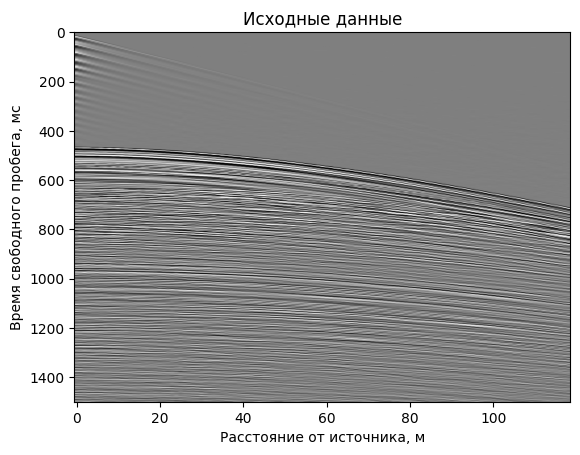

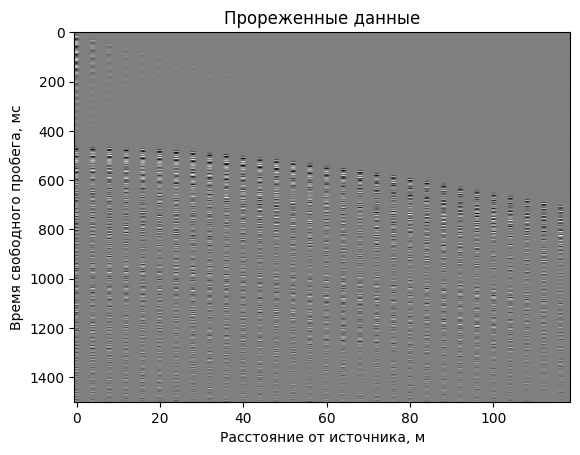

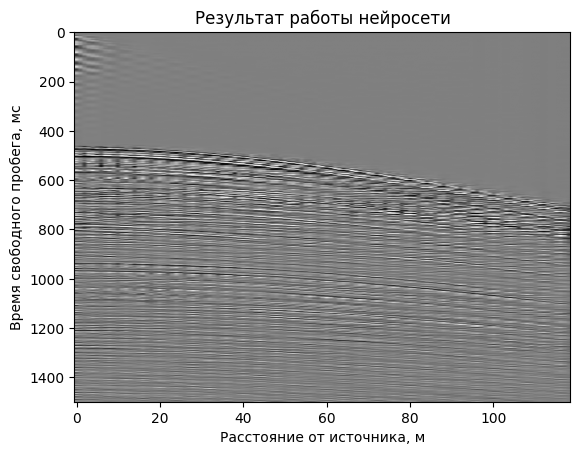

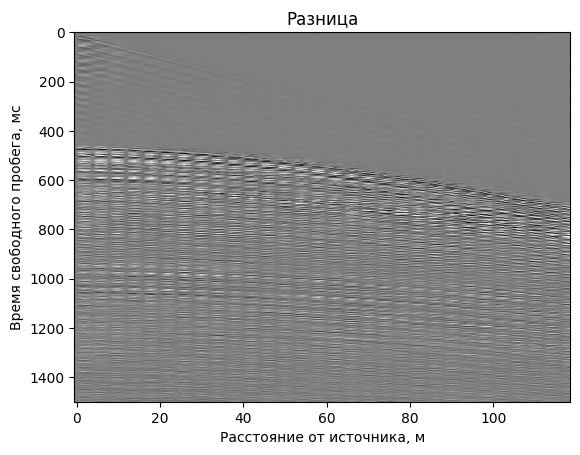

In [9]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

def preprocess_seismic_data(seismic_data, nsub, noise_level=0.1):
    """
    Preprocess seismic data by adding noise and subsampling traces.

    Parameters:
        seismic_data (np.ndarray): Original seismic data array.
        nsub (int): Subsampling factor. From every 'nsub' traces, only one is kept.
        noise_level (float): Standard deviation of the Gaussian noise to be added.

    Returns:
        np.ndarray: Preprocessed seismic data.
    """
    # Add Gaussian noise
    noise = np.random.normal(0, noise_level * np.std(seismic_data), seismic_data.shape)
    noisy_data = seismic_data + noise

    # Subsample traces by zeroing out
    kept_traces = np.arange(0, noisy_data.shape[1], nsub)
    subsampled_data = noisy_data.copy()
    for trace_idx in range(subsampled_data.shape[1]):
        if trace_idx not in kept_traces:
            subsampled_data[:, trace_idx] = 0

    return subsampled_data

# Load clear seismic data
x = np.load('test_data/GOMgain.npy')
x = x.astype(np.float64)

# Define preprocessing parameters
nsub = 4  # From every 5 traces, keep 1
noise_level = 0  # No noise added

# Preprocess the seismic data
y = preprocess_seismic_data(x, nsub, noise_level)

# Save the preprocessed data if needed
np.save('test_data/new_noise_and_miss.npy', y)

if __name__ == '__main__':
    model = torch.load('trained_model/model.pth')
    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    # Load the same clean data used for preprocessing
    x = np.load('test_data/GOMgain.npy')
    x = x.astype(np.float64)

    y = np.load('test_data/new_noise_and_miss.npy')

    # Ensure y has the same shape as x
    assert y.shape == x.shape, "Shapes of x and y do not match."

    # Create input tensor with batch and channel dimensions
    y_ = torch.from_numpy(y).unsqueeze(0).unsqueeze(1)  # Shape: (1, 1, height, width)

    # Get window size from the model or define it
    window_size = 8

    # Calculate padding for height and width
    batch_size, channels, height, width = y_.shape
    pad_height = (window_size - height % window_size) % window_size
    pad_width = (window_size - width % window_size) % window_size

    # Pad the tensor
    y_padded = F.pad(y_, (0, pad_width, 0, pad_height), mode='constant', value=0)

    # Proceed with the rest of the code
    torch.cuda.synchronize()
    start_time = time.time()
    y_padded = y_padded.type(torch.float32)
    y_padded = y_padded.cuda()

    x_ = model(y_padded)  # Inferences

    # Remove padding if necessary
    x_ = x_[:, :, :height, :width]

    x_ = x_.squeeze(0).squeeze(0).cpu().detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    # Calculate SNR and SSIM
    pre_snr = snr_(y, x)
    print("Before SNR: ", pre_snr)
    snr = snr_(x_, x)
    print("After SNR: ", snr)

    pre_ssim = ssim_(y, x, data_range=1.0)
    print("Before SSIM: ", pre_ssim)
    ssim = ssim_(x_, x, data_range=1.0)
    print("After SSIM: ", ssim)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Plot the data
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-0.1, vmax=0.1)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-0.1, vmax=0.1)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-0.1, vmax=0.1)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-0.1, vmax=0.1)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_21136\725623650.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model/model.pth')


Before SNR:  0.8074377706461366
After SNR:  1.2824708564852905
Before SSIM:  0.6283652816891436
After SSIM:  0.6370295521867572
MSE between original and denoised data:  0.003806564371152217


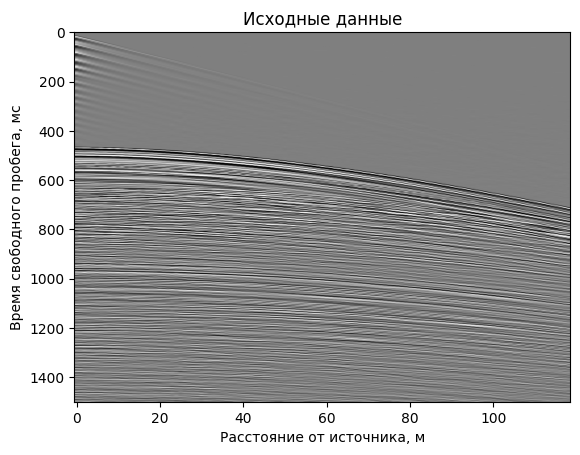

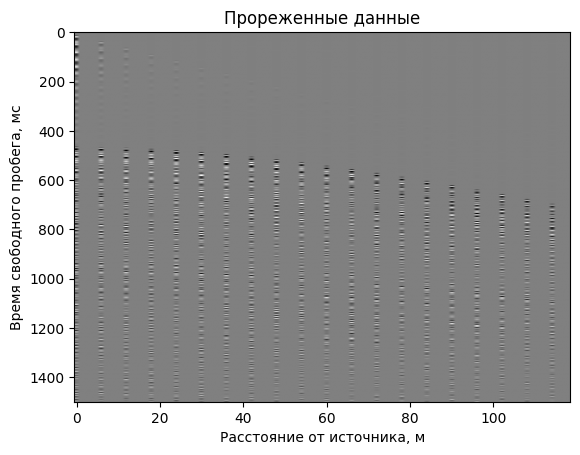

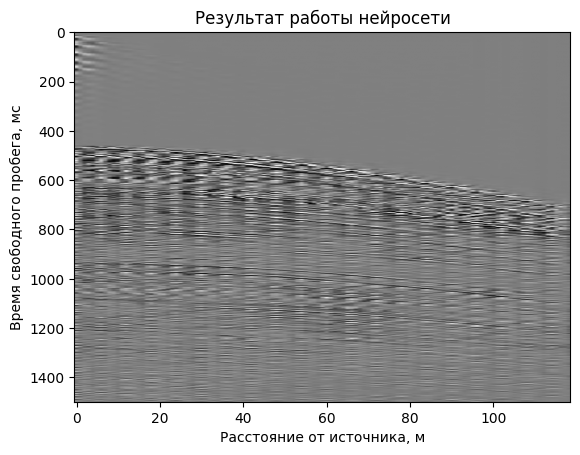

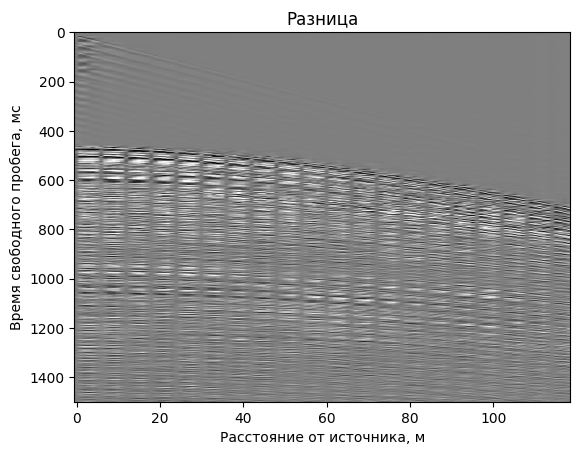

In [10]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

def preprocess_seismic_data(seismic_data, nsub, noise_level=0.1):
    """
    Preprocess seismic data by adding noise and subsampling traces.

    Parameters:
        seismic_data (np.ndarray): Original seismic data array.
        nsub (int): Subsampling factor. From every 'nsub' traces, only one is kept.
        noise_level (float): Standard deviation of the Gaussian noise to be added.

    Returns:
        np.ndarray: Preprocessed seismic data.
    """
    # Add Gaussian noise
    noise = np.random.normal(0, noise_level * np.std(seismic_data), seismic_data.shape)
    noisy_data = seismic_data + noise

    # Subsample traces by zeroing out
    kept_traces = np.arange(0, noisy_data.shape[1], nsub)
    subsampled_data = noisy_data.copy()
    for trace_idx in range(subsampled_data.shape[1]):
        if trace_idx not in kept_traces:
            subsampled_data[:, trace_idx] = 0

    return subsampled_data

# Load clear seismic data
x = np.load('test_data/GOMgain.npy')
x = x.astype(np.float64)

# Define preprocessing parameters
nsub = 6  # From every 5 traces, keep 1
noise_level = 0  # No noise added

# Preprocess the seismic data
y = preprocess_seismic_data(x, nsub, noise_level)

# Save the preprocessed data if needed
np.save('test_data/new_noise_and_miss.npy', y)

if __name__ == '__main__':
    model = torch.load('trained_model/model.pth')
    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    # Load the same clean data used for preprocessing
    x = np.load('test_data/GOMgain.npy')
    x = x.astype(np.float64)

    y = np.load('test_data/new_noise_and_miss.npy')

    # Ensure y has the same shape as x
    assert y.shape == x.shape, "Shapes of x and y do not match."

    # Create input tensor with batch and channel dimensions
    y_ = torch.from_numpy(y).unsqueeze(0).unsqueeze(1)  # Shape: (1, 1, height, width)

    # Get window size from the model or define it
    window_size = 8

    # Calculate padding for height and width
    batch_size, channels, height, width = y_.shape
    pad_height = (window_size - height % window_size) % window_size
    pad_width = (window_size - width % window_size) % window_size

    # Pad the tensor
    y_padded = F.pad(y_, (0, pad_width, 0, pad_height), mode='constant', value=0)

    # Proceed with the rest of the code
    torch.cuda.synchronize()
    start_time = time.time()
    y_padded = y_padded.type(torch.float32)
    y_padded = y_padded.cuda()

    x_ = model(y_padded)  # Inferences

    # Remove padding if necessary
    x_ = x_[:, :, :height, :width]

    x_ = x_.squeeze(0).squeeze(0).cpu().detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    # Calculate SNR and SSIM
    pre_snr = snr_(y, x)
    print("Before SNR: ", pre_snr)
    snr = snr_(x_, x)
    print("After SNR: ", snr)

    pre_ssim = ssim_(y, x, data_range=1.0)
    print("Before SSIM: ", pre_ssim)
    ssim = ssim_(x_, x, data_range=1.0)
    print("After SSIM: ", ssim)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Plot the data
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-0.1, vmax=0.1)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-0.1, vmax=0.1)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-0.1, vmax=0.1)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-0.1, vmax=0.1)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_21136\4168199206.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model/model.pth')


Before SNR:  3.0116186546255816
After SNR:  5.025847217183337
Before SSIM:  0.9834410622311105
After SSIM:  0.984412987043186
MSE between original and denoised data:  5.732796954761765e-06


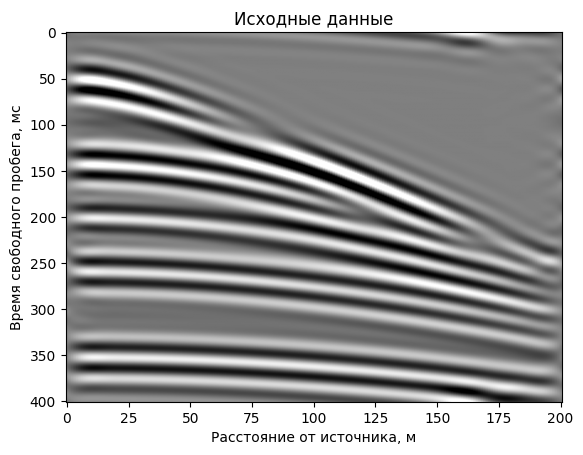

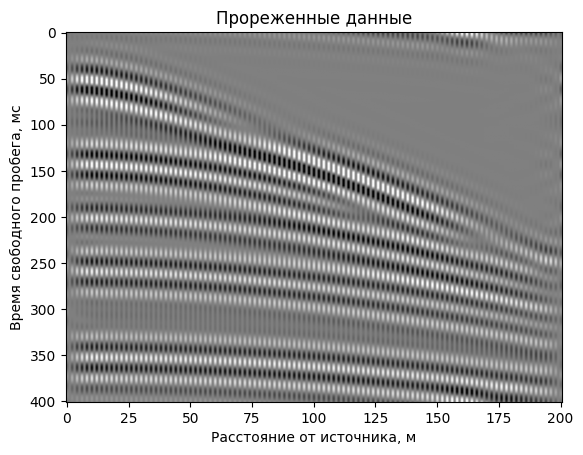

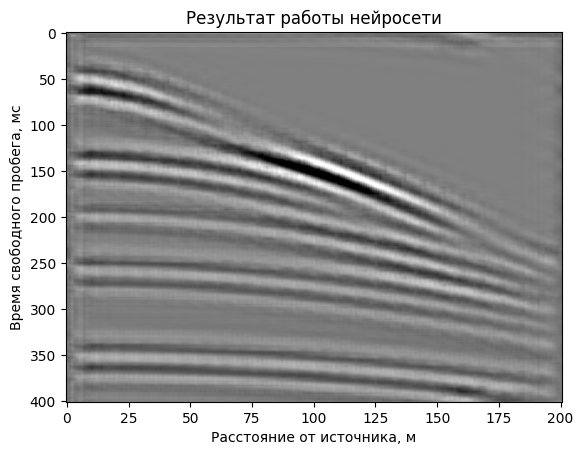

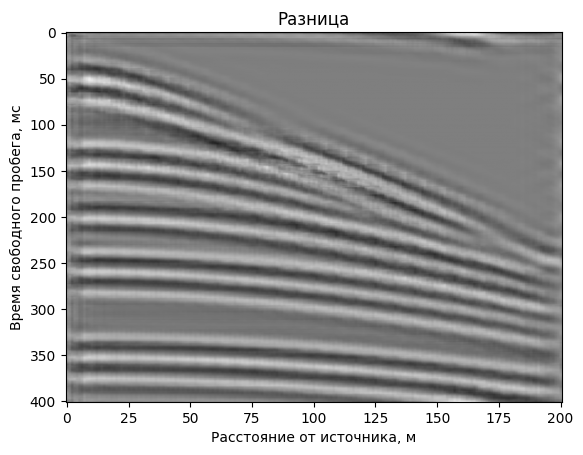

In [2]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

def preprocess_seismic_data(seismic_data, nsub, noise_level=0.1):
    """
    Preprocess seismic data by adding noise and subsampling traces.

    Parameters:
        seismic_data (np.ndarray): Original seismic data array.
        nsub (int): Subsampling factor. From every 'nsub' traces, only one is kept.
        noise_level (float): Standard deviation of the Gaussian noise to be added.

    Returns:
        np.ndarray: Preprocessed seismic data.
    """
    # Add Gaussian noise
    noise = np.random.normal(0, noise_level * np.std(seismic_data), seismic_data.shape)
    noisy_data = seismic_data + noise

    # Subsample traces by zeroing out
    kept_traces = np.arange(0, noisy_data.shape[1], nsub)
    subsampled_data = noisy_data.copy()
    for trace_idx in range(subsampled_data.shape[1]):
        if trace_idx not in kept_traces:
            subsampled_data[:, trace_idx] = 0

    return subsampled_data

# Load clear seismic data
x = np.load('test_data/Lf_datadense5.npy')
x = x.astype(np.float64)

# Define preprocessing parameters
nsub = 2  # From every 5 traces, keep 1
noise_level = 0  # No noise added

# Preprocess the seismic data
y = preprocess_seismic_data(x, nsub, noise_level)

# Save the preprocessed data if needed
np.save('test_data/new_noise_and_miss.npy', y)

if __name__ == '__main__':
    model = torch.load('trained_model/model.pth')
    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    # Load the same clean data used for preprocessing
    x = np.load('test_data/Lf_datadense5.npy')
    x = x.astype(np.float64)

    y = np.load('test_data/new_noise_and_miss.npy')

    # Ensure y has the same shape as x
    assert y.shape == x.shape, "Shapes of x and y do not match."

    # Create input tensor with batch and channel dimensions
    y_ = torch.from_numpy(y).unsqueeze(0).unsqueeze(1)  # Shape: (1, 1, height, width)

    # Get window size from the model or define it
    window_size = 8

    # Calculate padding for height and width
    batch_size, channels, height, width = y_.shape
    pad_height = (window_size - height % window_size) % window_size
    pad_width = (window_size - width % window_size) % window_size

    # Pad the tensor
    y_padded = F.pad(y_, (0, pad_width, 0, pad_height), mode='constant', value=0)

    # Proceed with the rest of the code
    torch.cuda.synchronize()
    start_time = time.time()
    y_padded = y_padded.type(torch.float32)
    y_padded = y_padded.cuda()

    x_ = model(y_padded)  # Inferences

    # Remove padding if necessary
    x_ = x_[:, :, :height, :width]

    x_ = x_.squeeze(0).squeeze(0).cpu().detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    # Calculate SNR and SSIM
    pre_snr = snr_(y, x)
    print("Before SNR: ", pre_snr)
    snr = snr_(x_, x)
    print("After SNR: ", snr)

    pre_ssim = ssim_(y, x, data_range=1.0)
    print("Before SSIM: ", pre_ssim)
    ssim = ssim_(x_, x, data_range=1.0)
    print("After SSIM: ", ssim)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Plot the data
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-0.01, vmax=0.01)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-0.01, vmax=0.01)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-0.01, vmax=0.01)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-0.01, vmax=0.01)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_21136\403137373.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model/model.pth')


Before SNR:  1.2505517707874452
After SNR:  1.4478955020316455
Before SSIM:  0.9700989329195502
After SSIM:  0.967002442640175
MSE between original and denoised data:  1.3066573978864094e-05


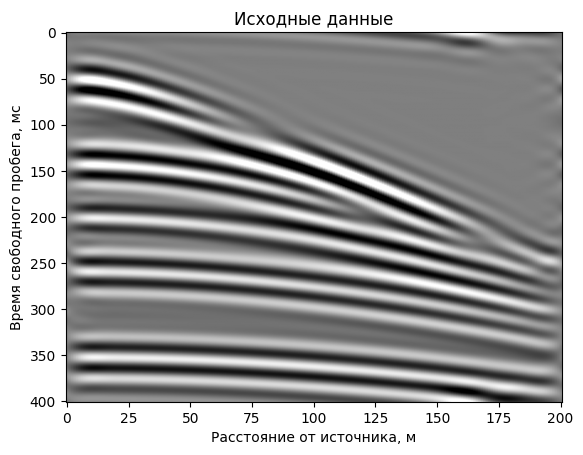

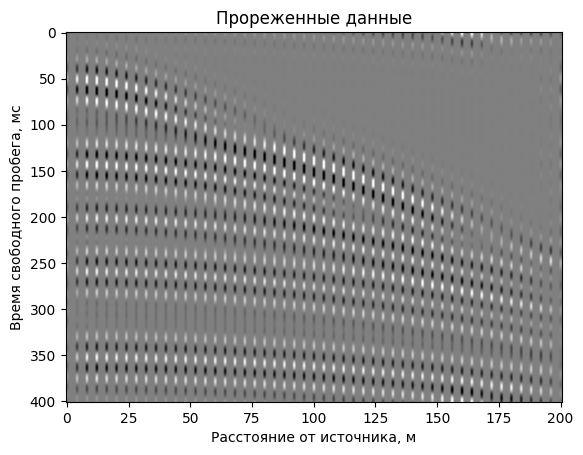

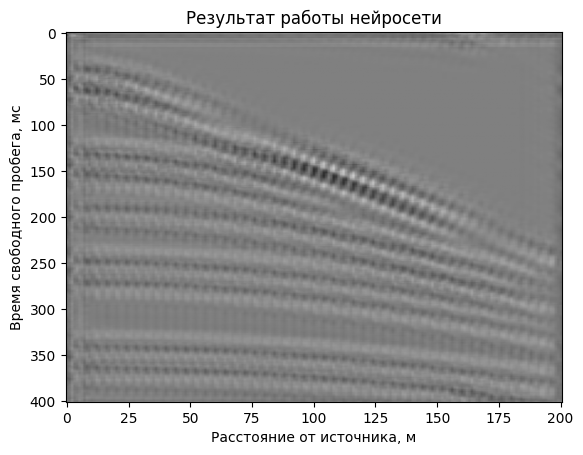

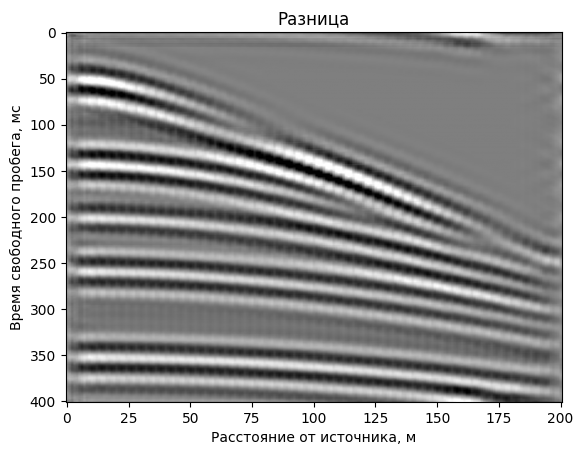

In [11]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

def preprocess_seismic_data(seismic_data, nsub, noise_level=0.1):
    """
    Preprocess seismic data by adding noise and subsampling traces.

    Parameters:
        seismic_data (np.ndarray): Original seismic data array.
        nsub (int): Subsampling factor. From every 'nsub' traces, only one is kept.
        noise_level (float): Standard deviation of the Gaussian noise to be added.

    Returns:
        np.ndarray: Preprocessed seismic data.
    """
    # Add Gaussian noise
    noise = np.random.normal(0, noise_level * np.std(seismic_data), seismic_data.shape)
    noisy_data = seismic_data + noise

    # Subsample traces by zeroing out
    kept_traces = np.arange(0, noisy_data.shape[1], nsub)
    subsampled_data = noisy_data.copy()
    for trace_idx in range(subsampled_data.shape[1]):
        if trace_idx not in kept_traces:
            subsampled_data[:, trace_idx] = 0

    return subsampled_data

# Load clear seismic data
x = np.load('test_data/Lf_datadense5.npy')
x = x.astype(np.float64)

# Define preprocessing parameters
nsub = 4  # From every 5 traces, keep 1
noise_level = 0  # No noise added

# Preprocess the seismic data
y = preprocess_seismic_data(x, nsub, noise_level)

# Save the preprocessed data if needed
np.save('test_data/new_noise_and_miss.npy', y)

if __name__ == '__main__':
    model = torch.load('trained_model/model.pth')
    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    # Load the same clean data used for preprocessing
    x = np.load('test_data/Lf_datadense5.npy')
    x = x.astype(np.float64)

    y = np.load('test_data/new_noise_and_miss.npy')

    # Ensure y has the same shape as x
    assert y.shape == x.shape, "Shapes of x and y do not match."

    # Create input tensor with batch and channel dimensions
    y_ = torch.from_numpy(y).unsqueeze(0).unsqueeze(1)  # Shape: (1, 1, height, width)

    # Get window size from the model or define it
    window_size = 8

    # Calculate padding for height and width
    batch_size, channels, height, width = y_.shape
    pad_height = (window_size - height % window_size) % window_size
    pad_width = (window_size - width % window_size) % window_size

    # Pad the tensor
    y_padded = F.pad(y_, (0, pad_width, 0, pad_height), mode='constant', value=0)

    # Proceed with the rest of the code
    torch.cuda.synchronize()
    start_time = time.time()
    y_padded = y_padded.type(torch.float32)
    y_padded = y_padded.cuda()

    x_ = model(y_padded)  # Inferences

    # Remove padding if necessary
    x_ = x_[:, :, :height, :width]

    x_ = x_.squeeze(0).squeeze(0).cpu().detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    # Calculate SNR and SSIM
    pre_snr = snr_(y, x)
    print("Before SNR: ", pre_snr)
    snr = snr_(x_, x)
    print("After SNR: ", snr)

    pre_ssim = ssim_(y, x, data_range=1.0)
    print("Before SSIM: ", pre_ssim)
    ssim = ssim_(x_, x, data_range=1.0)
    print("After SSIM: ", ssim)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Plot the data
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-0.01, vmax=0.01)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-0.01, vmax=0.01)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-0.01, vmax=0.01)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-0.01, vmax=0.01)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_21136\21219023.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model/model.pth')


Before SNR:  0.580629131291902
After SNR:  0.550615009025711
Before SSIM:  0.9621990760976096
After SSIM:  0.9606110317766936
MSE between original and denoised data:  1.606533481132689e-05


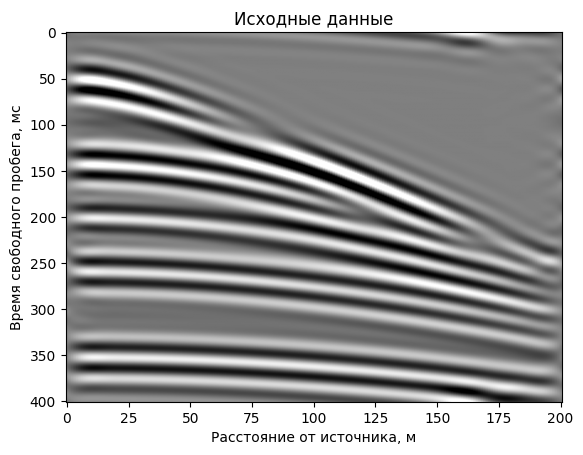

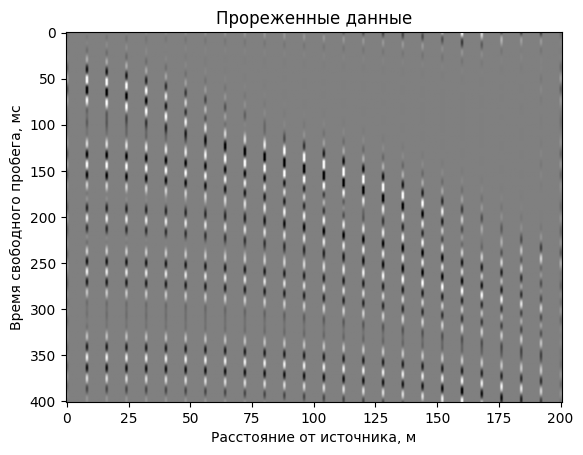

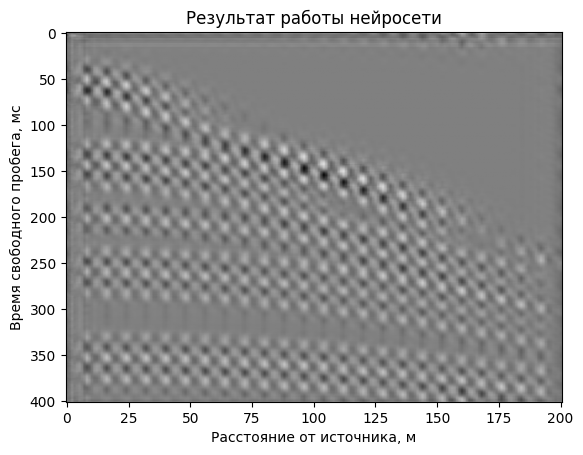

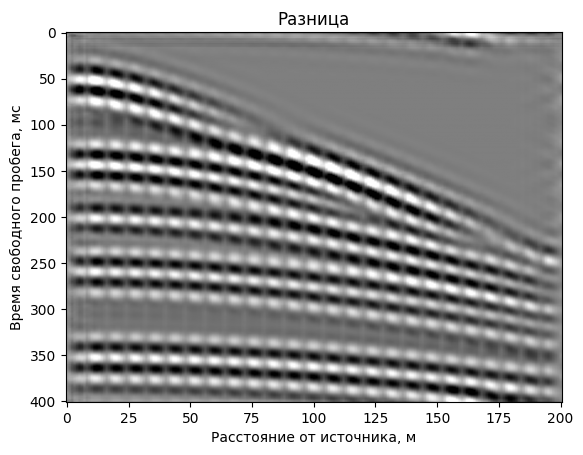

In [12]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

def preprocess_seismic_data(seismic_data, nsub, noise_level=0.1):
    """
    Preprocess seismic data by adding noise and subsampling traces.

    Parameters:
        seismic_data (np.ndarray): Original seismic data array.
        nsub (int): Subsampling factor. From every 'nsub' traces, only one is kept.
        noise_level (float): Standard deviation of the Gaussian noise to be added.

    Returns:
        np.ndarray: Preprocessed seismic data.
    """
    # Add Gaussian noise
    noise = np.random.normal(0, noise_level * np.std(seismic_data), seismic_data.shape)
    noisy_data = seismic_data + noise

    # Subsample traces by zeroing out
    kept_traces = np.arange(0, noisy_data.shape[1], nsub)
    subsampled_data = noisy_data.copy()
    for trace_idx in range(subsampled_data.shape[1]):
        if trace_idx not in kept_traces:
            subsampled_data[:, trace_idx] = 0

    return subsampled_data

# Load clear seismic data
x = np.load('test_data/Lf_datadense5.npy')
x = x.astype(np.float64)

# Define preprocessing parameters
nsub = 8  # From every 5 traces, keep 1
noise_level = 0  # No noise added

# Preprocess the seismic data
y = preprocess_seismic_data(x, nsub, noise_level)

# Save the preprocessed data if needed
np.save('test_data/new_noise_and_miss.npy', y)

if __name__ == '__main__':
    model = torch.load('trained_model/model.pth')
    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    # Load the same clean data used for preprocessing
    x = np.load('test_data/Lf_datadense5.npy')
    x = x.astype(np.float64)

    y = np.load('test_data/new_noise_and_miss.npy')

    # Ensure y has the same shape as x
    assert y.shape == x.shape, "Shapes of x and y do not match."

    # Create input tensor with batch and channel dimensions
    y_ = torch.from_numpy(y).unsqueeze(0).unsqueeze(1)  # Shape: (1, 1, height, width)

    # Get window size from the model or define it
    window_size = 8

    # Calculate padding for height and width
    batch_size, channels, height, width = y_.shape
    pad_height = (window_size - height % window_size) % window_size
    pad_width = (window_size - width % window_size) % window_size

    # Pad the tensor
    y_padded = F.pad(y_, (0, pad_width, 0, pad_height), mode='constant', value=0)

    # Proceed with the rest of the code
    torch.cuda.synchronize()
    start_time = time.time()
    y_padded = y_padded.type(torch.float32)
    y_padded = y_padded.cuda()

    x_ = model(y_padded)  # Inferences

    # Remove padding if necessary
    x_ = x_[:, :, :height, :width]

    x_ = x_.squeeze(0).squeeze(0).cpu().detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    # Calculate SNR and SSIM
    pre_snr = snr_(y, x)
    print("Before SNR: ", pre_snr)
    snr = snr_(x_, x)
    print("After SNR: ", snr)

    pre_ssim = ssim_(y, x, data_range=1.0)
    print("Before SSIM: ", pre_ssim)
    ssim = ssim_(x_, x, data_range=1.0)
    print("After SSIM: ", ssim)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Plot the data
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-0.01, vmax=0.01)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-0.01, vmax=0.01)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-0.01, vmax=0.01)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-0.01, vmax=0.01)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_21136\294713195.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model/model.pth')


Before SNR:  1.2823968249034448
After SNR:  0.45522638980333197
Before SSIM:  0.16732506604952607
After SSIM:  0.10897419087574745
MSE between original and denoised data:  42233.094654185195


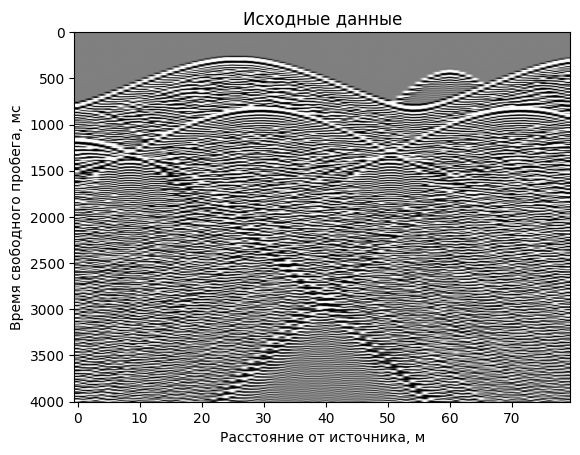

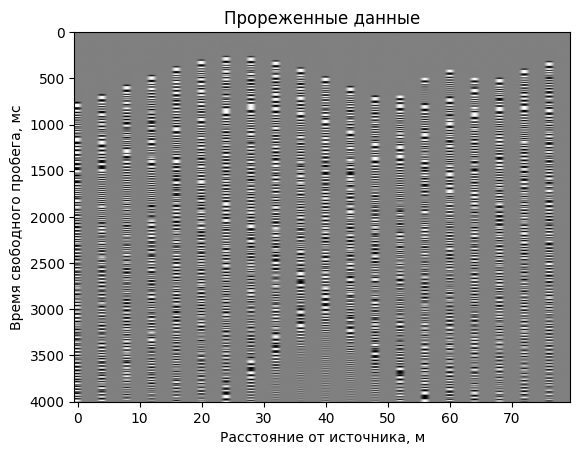

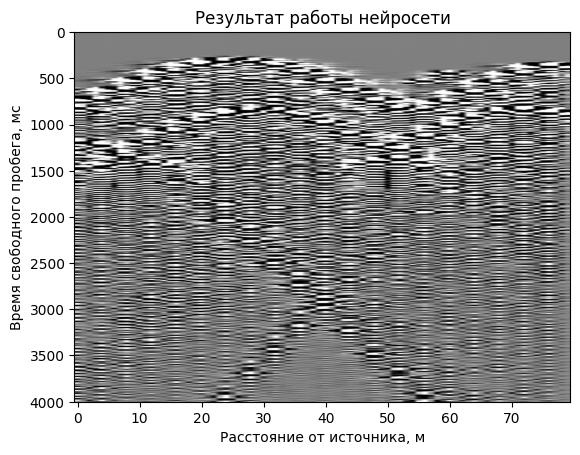

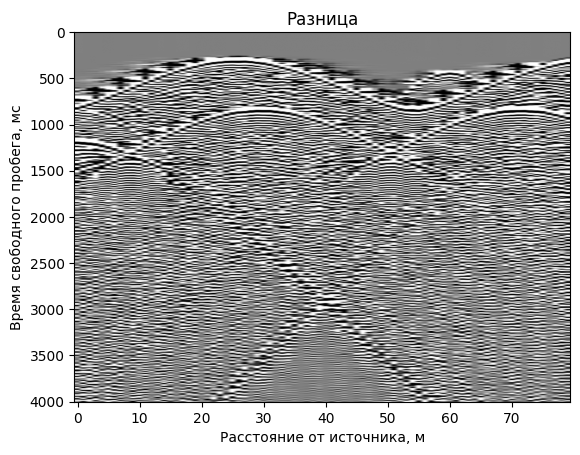

In [3]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

def preprocess_seismic_data(seismic_data, nsub, noise_level=0.1):
    """
    Preprocess seismic data by adding noise and subsampling traces.

    Parameters:
        seismic_data (np.ndarray): Original seismic data array.
        nsub (int): Subsampling factor. From every 'nsub' traces, only one is kept.
        noise_level (float): Standard deviation of the Gaussian noise to be added.

    Returns:
        np.ndarray: Preprocessed seismic data.
    """
    # Add Gaussian noise
    noise = np.random.normal(0, noise_level * np.std(seismic_data), seismic_data.shape)
    noisy_data = seismic_data + noise

    # Subsample traces by zeroing out
    kept_traces = np.arange(0, noisy_data.shape[1], nsub)
    subsampled_data = noisy_data.copy()
    for trace_idx in range(subsampled_data.shape[1]):
        if trace_idx not in kept_traces:
            subsampled_data[:, trace_idx] = 0

    return subsampled_data

# Load clear seismic data
x = np.load('test_data/zero-offset_data_50m_step.npy')
x = x.astype(np.float64)

# Define preprocessing parameters
nsub = 4  # From every 5 traces, keep 1
noise_level = 0 # No noise added

# Preprocess the seismic data
y = preprocess_seismic_data(x, nsub, noise_level)

# Save the preprocessed data if needed
np.save('test_data/new_noise_and_miss.npy', y)

if __name__ == '__main__':
    model = torch.load('trained_model/model.pth')
    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    # Load the same clean data used for preprocessing
    x = np.load('test_data/zero-offset_data_50m_step.npy')
    x = x.astype(np.float64)

    y = np.load('test_data/new_noise_and_miss.npy')

    # Ensure y has the same shape as x
    assert y.shape == x.shape, "Shapes of x and y do not match."

    # Create input tensor with batch and channel dimensions
    y_ = torch.from_numpy(y).unsqueeze(0).unsqueeze(1)  # Shape: (1, 1, height, width)

    # Get window size from the model or define it
    window_size = 8

    # Calculate padding for height and width
    batch_size, channels, height, width = y_.shape
    pad_height = (window_size - height % window_size) % window_size
    pad_width = (window_size - width % window_size) % window_size

    # Pad the tensor
    y_padded = F.pad(y_, (0, pad_width, 0, pad_height), mode='constant', value=0)

    # Proceed with the rest of the code
    torch.cuda.synchronize()
    start_time = time.time()
    y_padded = y_padded.type(torch.float32)
    y_padded = y_padded.cuda()

    x_ = model(y_padded)  # Inferences

    # Remove padding if necessary
    x_ = x_[:, :, :height, :width]

    x_ = x_.squeeze(0).squeeze(0).cpu().detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    # Calculate SNR and SSIM
    pre_snr = snr_(y, x)
    print("Before SNR: ", pre_snr)
    snr = snr_(x_, x)
    print("After SNR: ", snr)

    pre_ssim = ssim_(y, x, data_range=1.0)
    print("Before SSIM: ", pre_ssim)
    ssim = ssim_(x_, x, data_range=1.0)
    print("After SSIM: ", ssim)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Plot the data
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-5, vmax=5)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-5, vmax=5)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-5, vmax=5)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-5, vmax=5)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

C:\Users\RobotComp.ru\AppData\Local\Temp\ipykernel_10092\3930136766.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('trained_model/model.pth')


Before SNR:  1.2823968249034448
After SNR:  0.45522638980333197
Before SSIM:  0.16732506604952607
After SSIM:  0.10897419087574745
MSE between original and denoised data:  42233.094654185195


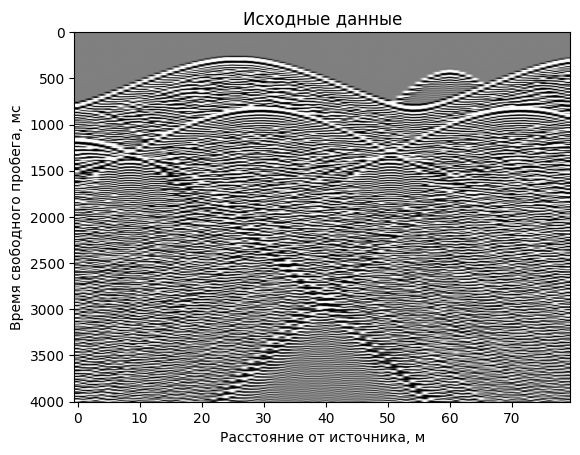

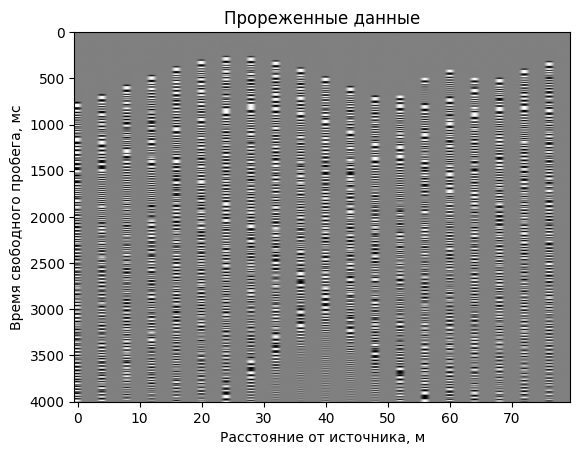

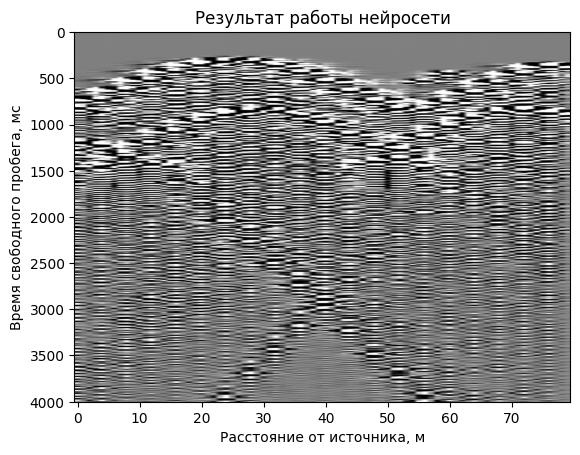

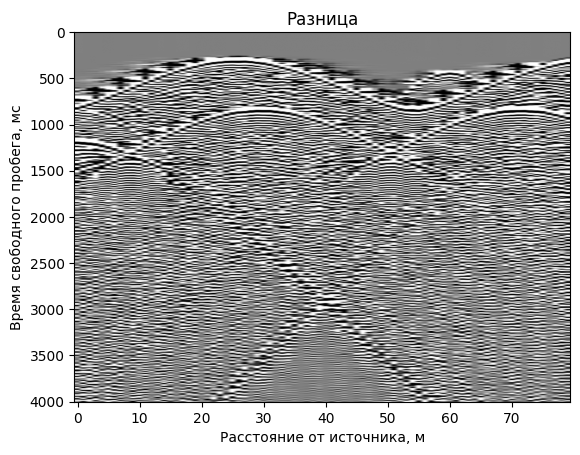

In [13]:
# -*- coding: utf-8 -*-
from util.My_tool1 import *
import time
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

def preprocess_seismic_data(seismic_data, nsub, noise_level=0.1):
    """
    Preprocess seismic data by adding noise and subsampling traces.

    Parameters:
        seismic_data (np.ndarray): Original seismic data array.
        nsub (int): Subsampling factor. From every 'nsub' traces, only one is kept.
        noise_level (float): Standard deviation of the Gaussian noise to be added.

    Returns:
        np.ndarray: Preprocessed seismic data.
    """
    # Add Gaussian noise
    noise = np.random.normal(0, noise_level * np.std(seismic_data), seismic_data.shape)
    noisy_data = seismic_data + noise

    # Subsample traces by zeroing out
    kept_traces = np.arange(0, noisy_data.shape[1], nsub)
    subsampled_data = noisy_data.copy()
    for trace_idx in range(subsampled_data.shape[1]):
        if trace_idx not in kept_traces:
            subsampled_data[:, trace_idx] = 0

    return subsampled_data

# Load clear seismic data
x = np.load('test_data/zero-offset_data_50m_step.npy')
x = x.astype(np.float64)

# Define preprocessing parameters
nsub = 4  # From every 5 traces, keep 1
noise_level = 0  # No noise added

# Preprocess the seismic data
y = preprocess_seismic_data(x, nsub, noise_level)

# Save the preprocessed data if needed
np.save('test_data/new_noise_and_miss.npy', y)

if __name__ == '__main__':
    model = torch.load('trained_model/model.pth')
    model.eval()  # evaluation mode
    if torch.cuda.is_available():
        model = model.cuda()

    # Load the same clean data used for preprocessing
    x = np.load('test_data/zero-offset_data_50m_step.npy')
    x = x.astype(np.float64)

    y = np.load('test_data/new_noise_and_miss.npy')

    # Ensure y has the same shape as x
    assert y.shape == x.shape, "Shapes of x and y do not match."

    # Create input tensor with batch and channel dimensions
    y_ = torch.from_numpy(y).unsqueeze(0).unsqueeze(1)  # Shape: (1, 1, height, width)

    # Get window size from the model or define it
    window_size = 8

    # Calculate padding for height and width
    batch_size, channels, height, width = y_.shape
    pad_height = (window_size - height % window_size) % window_size
    pad_width = (window_size - width % window_size) % window_size

    # Pad the tensor
    y_padded = F.pad(y_, (0, pad_width, 0, pad_height), mode='constant', value=0)

    # Proceed with the rest of the code
    torch.cuda.synchronize()
    start_time = time.time()
    y_padded = y_padded.type(torch.float32)
    y_padded = y_padded.cuda()

    x_ = model(y_padded)  # Inferences

    # Remove padding if necessary
    x_ = x_[:, :, :height, :width]

    x_ = x_.squeeze(0).squeeze(0).cpu().detach().numpy().astype(np.float64)
    torch.cuda.synchronize()
    elapsed_time = time.time() - start_time

    # Calculate SNR and SSIM
    pre_snr = snr_(y, x)
    print("Before SNR: ", pre_snr)
    snr = snr_(x_, x)
    print("After SNR: ", snr)

    pre_ssim = ssim_(y, x, data_range=1.0)
    print("Before SSIM: ", pre_ssim)
    ssim = ssim_(x_, x, data_range=1.0)
    print("After SSIM: ", ssim)

    # Calculate MSE between original and denoised data
    mse = np.mean((x - x_) ** 2)
    print("MSE between original and denoised data: ", mse)

    # Plot the data
    plt.imshow(x, cmap='gray', aspect='auto', vmin=-5, vmax=5)
    plt.title("Исходные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(y, cmap='gray', aspect='auto', vmin=-5, vmax=5)
    plt.title("Прореженные данные")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x_, cmap='gray', aspect='auto', vmin=-5, vmax=5)
    plt.title("Результат работы нейросети")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()

    plt.imshow(x-x_, cmap='gray', aspect='auto', vmin=-5, vmax=5)
    plt.title("Разница")
    plt.xlabel('Расстояние от источника, м')
    plt.ylabel('Время свободного пробега, мс')
    plt.show()